# Derin Öğrenme ile Göğüs Röntgeninden COVID-19 Tespitinin Yapılması

Görüntülerinin Sınıflandırılması: Normal, Viral Pneumonia, COVID-19

Proje kapsamında kullanılan veriseti Kaggle üzerinden elde edilmiştir:
[COVID-19 Radiography Dataset] Veriseti linki : https://www.kaggle.com/tawsifurrahman/covid19-radiography-database

# Projede Kullanılan Kütüphanelerin Import Edilmesi

In [1]:
#Gerekli kütüphanelerin girilmesi

import os
import shutil
import random
import torch
import torchvision
import numpy as np

from PIL import Image
from matplotlib import pyplot as plt

torch.manual_seed(0)

print('Using PyTorch version', torch.__version__)

Using PyTorch version 1.3.1


# Eğitim (Train) ve Test Verilerinin Hazırlanması

In [2]:
classNamesArray = ['normal', 'viral', 'covid']
baseFolder = 'COVID-19 Radiography Database'
sourceFolder = ['NORMAL', 'Viral Pneumonia', 'COVID-19']

if os.path.isdir(os.path.join(baseFolder, sourceFolder[1])):
    os.mkdir(os.path.join(baseFolder, 'test'))

    for i, d in enumerate(sourceFolder):
        os.rename(os.path.join(baseFolder, d), os.path.join(baseFolder, classNamesArray[i]))

    for c in classNamesArray:
        os.mkdir(os.path.join(baseFolder, 'test', c))

    for c in classNamesArray:
        images = [x for x in os.listdir(os.path.join(baseFolder, c)) if x.lower().endswith('png')]
        selected_images = random.sample(images, 30)
        for image in selected_images:
            source_path = os.path.join(baseFolder, c, image)
            target_path = os.path.join(baseFolder, 'test', c, image)
            shutil.move(source_path, target_path)

# Verisetinin Özelleştirilmesi

In [3]:
#Custom Dataset ile train ve test verisetlerinin oluşturulması için:

#transform data augmentation için kullanılacak
    #training transformation yapılacak. 
    #test transformation yapılmayacak ama yine de görüntüleri iki tensore dönüştüreceğiz ve normalizasyon yapacağız.

    #get_images : görüntülerin klasörlerde gezinerek ve .png formatında olduğundan emin olarak konumlarını ve klas adını
    #alıp, images değişkenine atanmasını sağlar. ve o görüntü listesini döndürür.
    
    

In [4]:
class ChestXRayDataset(torch.utils.data.Dataset):
    def __init__(self, imageFolders, transform): 
        def get_images(className):

            images = [x for x in os.listdir(imageFolders[className]) if x[-3:].lower().endswith('png')]
            #print(images)
            print(f'{len(images)} adet {className} örnek bulundu')
            return images
        
        self.images = {}
        self.classNamesArray = ['normal', 'viral', 'covid']
        
        for className in self.classNamesArray:
            self.images[className] = get_images(className)
            
        self.imageFolders = imageFolders
        self.transform = transform
        
    
    def __len__(self): #length of the dataset. Tüm sınıflardaki verisetin sayılarını alır ve toplayarak döndürür.
        return sum([len(self.images[className]) for className in self.classNamesArray])
    
    #Ana fonksiyon
    def __getitem__(self, index): #3 kanallı RGB'ye dönüştürülmüş görüntüyü şablonuyla birlikte dönüştürür.
        
        className = random.choice(self.classNamesArray) #rastgele 3 sınıftan birisini döndür
        index = index % len(self.images[className]) 
        imgName = self.images[className][index]  #sınıfa ait olan görüntünün indeksi ile birlikte atanması
        imgPath = os.path.join(self.imageFolders[className], imgName) #görüntünün yolunun verilmesi
        
        #konumu ve sınıfıyle birlikte indeksi tanımlanan görüntü artık dosyadan yüklenebilir:
        #Görüntülerin çoğu siyah-beyaz olduğu için RGB formatta çekiyoruz.
        # Eğer CNN'i baştan yapmış olsaydık, bu şekilde yapmamız gerekmeyecekti. Çünkü yapay sinir ağında 
        # tek kanallı bir değer (a value of one channel) girmemiz gerekecekti.
        # Ama ResNet18 kullandığımız ve Image Net verisetinde daha önce eğitilmiş olan
        # resnet18'in pre-trained weights (eğitilmiş ağırlıklar) kullanacağız
        # resnet18 import'un yani girişlerin zaten tanımlandığı için 3 kanallı bir değer girmemiz gerekmektedir.
        # Bu yüzden görüntülerin RGB'ye dönüştürülerek bu üç kanallı değerlerin girilmesi sağlanmaktadır.
        
        
        image = Image.open(imgPath).convert('RGB')
        
        # Pytorch PIL kütüphanesiyle çekilmiş olan görüntüleri anlamamaktadır. Bu yüzden tensor halinde modele 
        # girdi olarak verilmelidir. 
        # self.transform ile görüntünün tensörlere dönüştürülmesi sağlanacaktır.
        return self.transform(image), self.classNamesArray.index(className) #görüntüyü ve şablonu (label) döndür

# Görüntülerin Dönüşümleri

In [5]:
# eğitim ve test verisetlerine uygulanacak olan objelerin dönüşümünün yapıldığı bölümdür.

In [6]:
#resnet18 modelinin image net pre-trained weights'i kullanıldığı için modelin kabul ettiği şekilde dönüşümlerin 
# yapılması gerekmektedir.

## TRAIN SET TRANSFORMATION:
trainTransformation = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)), #veya 227, 227, pre-trained olmasaydı custom size yapabilirdik.
    torchvision.transforms.RandomHorizontalFlip(),  # data augmentation -araştır- ve 4. 03:00 tekrar bak
    torchvision.transforms.ToTensor(),              # pytorch'un kullanabilmesi için görüntüyü tensöre çevir 
    
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                                     std=[0.229, 0.224, 0.225]) # normalize data.
    #resnet18 modelindeki image datasetindeki spesicif değerlere göre normalize etmek:
    #image set'in normalize olduğu şekilde normalize ediyoruz.
    #mean - araştır
    #std  - araştır
])

## TEST SET TRANSFORMATION:
#train'deki gibi yapılabilir ama testte veya validasyonda setlerde data augmentation kullanılmıyor.
testTransformation = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

#Artık model için dönültürülmüş objelerimiz yani görsellerimiz var.

# DataLoader'ın Hazırlanması

PyTorch, bir veri kümesindeki verileri bir modül aracılığıyla ('ingest') alma mekanizmasına sahiptir ve bu DataLoader olarak bilinir. Bu dataLoader, derin öğrenme modeline elde edilen verileri basar.

In [7]:
trainFolders = {
    'normal': 'COVID-19 Radiography Database/normal',
    'viral' : 'COVID-19 Radiography Database/viral',
    'covid' : 'COVID-19 Radiography Database/covid'
}

trainDataset = ChestXRayDataset(trainFolders, trainTransformation)

1311 adet normal örnek bulundu
1315 adet viral örnek bulundu
189 adet covid örnek bulundu


In [8]:
len(trainDataset)

2815

In [9]:
testFolders = {
    'normal': 'COVID-19 Radiography Database/test/normal',
    'viral' : 'COVID-19 Radiography Database/test/viral',
    'covid' : 'COVID-19 Radiography Database/test/covid'
}

testDataset = ChestXRayDataset(testFolders, testTransformation)


30 adet normal örnek bulundu
30 adet viral örnek bulundu
30 adet covid örnek bulundu


In [10]:
len(testDataset)

90

In [11]:
#DataLoader(dataset, batch_size=1, shuffle=False, sampler=None,
#           batch_sampler=None, num_workers=0, collate_fn=None,
#           pin_memory=False, drop_last=False, timeout=0,
#           worker_init_fn=None, *, prefetch_factor=2,
#           persistent_workers=False)

#TORCH.UTILS.DATA -> Araştırılacak ve makaleye yazılacak!
    
batchSize = 6

dataLoaderTrain = torch.utils.data.DataLoader(trainDataset, batch_size=batchSize, shuffle=True) #shuffle: sırayla alma
dataLoaderTest = torch.utils.data.DataLoader(testDataset, batch_size=batchSize, shuffle=True)

print('Eğitilmiş verisetinin batch boyutu : ', len(dataLoaderTrain))
print('Test verisetinin batch boyutu : ', len(dataLoaderTest))

# dataLoaderTrain ve dataLoaderTest, oluşturulacak olan veriseti modeline yüklenmek üzere dataloader'dan geçmiş bulunmaktadır.
# Bu veriler, model üzerinden geçilerek modelin öğrenmesini sağlayacaktır.

Eğitilmiş verisetinin batch boyutu :  470
Test verisetinin batch boyutu :  15


# Verilerin Görselleştirilmesi

In [12]:
classNamesArray = trainDataset.classNamesArray
print(classNamesArray)

def ShowImages(images, labels, preds):  #görüntü, şablon adı, tahminleme
    plt.figure(figsize=(8, 4))
    for i, image in enumerate(images):
        plt.subplot(1, 6, i + 1, xticks=[], yticks=[])
        image = image.numpy().transpose((1, 2, 0))    #görüntüyü numpy ile matrislere sonra da tensöre dönüştür
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = image * std + mean
        image = np.clip(image, 0., 1.)
        plt.imshow(image)
        col = 'green'
        if preds[i] != labels[i]: #Tahmin edilenle label aynı değilse, model yanlış tahmin etti.
            col = 'red'
            
        plt.xlabel(f'{classNamesArray[int(labels[i].numpy())]}')
        plt.ylabel(f'{classNamesArray[int(preds[i].numpy())]}', color=col)
    plt.tight_layout()
    plt.show()

['normal', 'viral', 'covid']


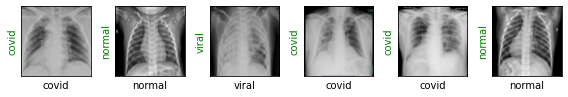

In [13]:

images, labels = next(iter(dataLoaderTrain)) #Bir sonraki batch'i çek
preds = labels                   #Preds model olmadığı için yok o yüzden lablel'i tekrar parametre olarak verdik
ShowImages(images, labels, preds)

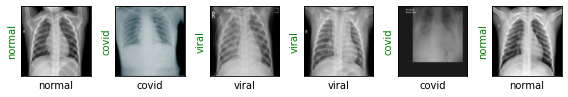

In [14]:
images, labels = next(iter(dataLoaderTest))
preds = labels                   #Preds model olmadığı için yok o yüzden lablel'i tekrar parametre olarak verdik
ShowImages(images, labels, preds)

# Modelin Oluşturulması

In [15]:
#Resnet18 modelinin yüklenmesi
#torchvision ile başka modellerin eklenmesi gerçekleştirilebilir.

resnet18 = torchvision.models.resnet18(pretrained=True)  #resnet18 daha hızlı ve verisetimiz de zaten az

print(resnet18) #model objenin mimarisini yazdır

# resnet18 model imagenet verisetini kullanmaktadır.
# imagenet veriseti içerisinde toplamda 1000 adet sınıf bulunmaktadır.
# Ancak projede 3 adet model olduğu için modeli doğrudan kullanamayız!
# Modelin son katmanını olan fully connected layer, modelin ürettiklerini flatten ile tek bir çıktı halinde
# göstermek için, model 1000 adet çıktı kullanmaktadır.
# Burada son kaymı değiştirerek 3 adet çıktı verecek şekilde yeniden tasarlamak gerekmektedir.

# Linear(in_features=512, out_features=1000, bias=True)
# output features (çıktı özellikleri) sayısı 1000

# fc dışında diğer katmanlar aynı şekilde kalabilirler.

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [16]:
##ÖRNEK - ResNet50 modeli

resnet50 = torchvision.models.resnet50(pretrained=True)

print(resnet50)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [17]:
#resnet modelini elde ettikten sonra herbir katmanındaki parametre değerlerini değiştirebiliriz

#fc katmanını değiştirebilmek için:
resnet18.fc = torch.nn.Linear(in_features=512, out_features=3)
lossFunction = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet18.parameters(), lr=3e-5)  #adam optimization kullandık

#resnet18.parameters() : modeldeki parametreler
#lr : learning rate - öğrenme katsayısı


In [29]:
#modeli eğitmeden önce resnet18'in görüntü sınıflandırma 
#yöntemini kullanarak verisetleri üzerinden tahminleme yaptırabiliriz:

def ResultPrediction():
    resnet18.eval() #daha fazla değerlendirme yap
    images, labels = next(iter(dataLoaderTest))#test veriseti üzerinden bazı random görüntüleri al
    outputs = resnet18(images)
    values, preds = torch.max(outputs, 1)
    print(values)
    print(preds)
    print(labels)
    ShowImages(images, labels, preds)
    
    #print(values)

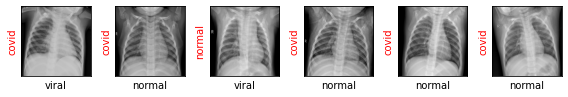

In [19]:
ResultPrediction()
#Model henüz öğrenemediği için rastgele tahminlemeler yapmaktadır.
#Model öğrendikçe bu fonksiyon kullanılarak model tahminlemesi yaptırılacaktır.

# Modelin Eğitilmesi

In [23]:
def TrainModel(epochs):
    print('Modelin eğitimi başladı..')
    
    #Bir epoch içerisinde birden fazla kez değerlenme yapıyor / evaulate ediyor.

    for e in range(0, epochs):
        
        print('='*20)
        print(f'Epoch başlatılıyor : {e + 1}/{epochs}')
        print('='*20)

        trainLossValue = 0.
        validationLosss = 0.

        resnet18.train()    #Modelin eğitim aşamasına ayarlanması

        for trainStep, (images, labels) in enumerate(dataLoaderTrain):
            
            optimizer.zero_grad()
            outputs = resnet18(images)
            loss = lossFunction(outputs, labels)
            loss.backward()
            optimizer.step()
            trainLossValue += loss.item()
            
            if trainStep % 20 == 0:
                print('Eğitim Aşaması : ', trainStep)

                accuracy = 0

                resnet18.eval() # set model to eval phase

                for validationStep, (images, labels) in enumerate(dataLoaderTest):
                   
                    outputs = resnet18(images)
                    loss = lossFunction(outputs, labels)
                    validationLosss += loss.item()

                    _, preds = torch.max(outputs, 1)
                    accuracy += sum((preds == labels).numpy())

                validationLosss /= (validationStep + 1)
                accuracy = accuracy/len(testDataset)
                print(f'Kayıp (Val. Loss): {validationLosss:.4f}, Doğruluk (Accuracy): {accuracy:.4f}')

                ResultPrediction()

                resnet18.train()

                #if accuracy >= 0.95:
                #    print('Performans koşulu yeterli, model eğitimi durduruluyor..')
                #    return

        trainLossValue /= (trainStep + 1)

        print(f'Eğitim Kayıbı (Training Loss) : {trainLossValue:.4f}')
    print('Eğitim Tamamlanmıştır!')

Modelin eğitimi başladı..
Epoch başlatılıyor :, 1/10
Eğitim Aşaması :  0
Kayıp (Val. Loss): 0.1179, Doğruluk (Accuracy): 0.9556


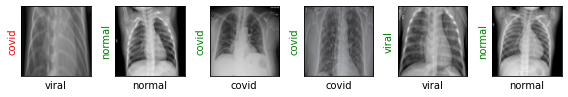

Eğitim Aşaması :  20
Kayıp (Val. Loss): 0.1573, Doğruluk (Accuracy): 0.9222


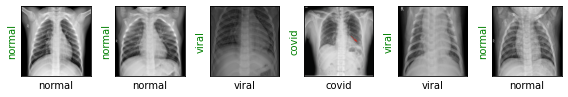

Eğitim Aşaması :  40
Kayıp (Val. Loss): 0.1748, Doğruluk (Accuracy): 0.9333


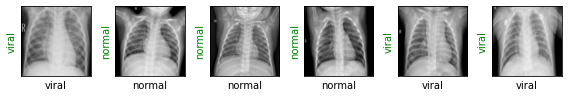

Eğitim Aşaması :  60
Kayıp (Val. Loss): 0.1329, Doğruluk (Accuracy): 0.9667


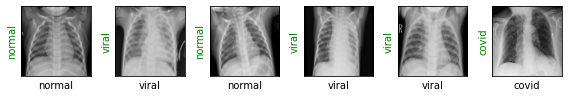

Eğitim Aşaması :  80
Kayıp (Val. Loss): 0.1480, Doğruluk (Accuracy): 0.9444


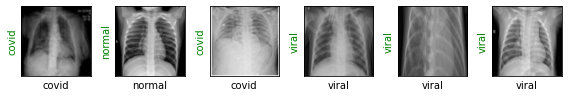

Eğitim Aşaması :  100
Kayıp (Val. Loss): 0.2545, Doğruluk (Accuracy): 0.9000


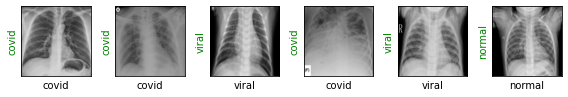

Eğitim Aşaması :  120
Kayıp (Val. Loss): 0.1177, Doğruluk (Accuracy): 0.9556


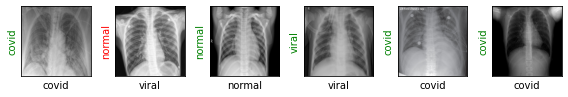

Eğitim Aşaması :  140
Kayıp (Val. Loss): 0.1313, Doğruluk (Accuracy): 0.9667


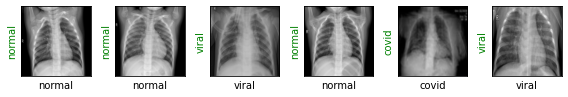

Eğitim Aşaması :  160
Kayıp (Val. Loss): 0.0893, Doğruluk (Accuracy): 0.9778


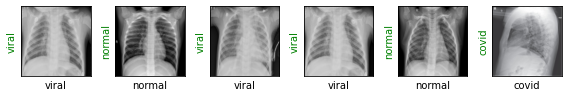

Eğitim Aşaması :  180
Kayıp (Val. Loss): 0.0568, Doğruluk (Accuracy): 1.0000


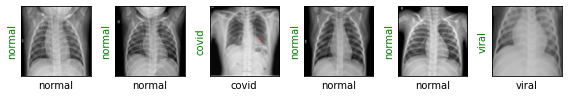

Eğitim Aşaması :  200
Kayıp (Val. Loss): 0.3370, Doğruluk (Accuracy): 0.8778


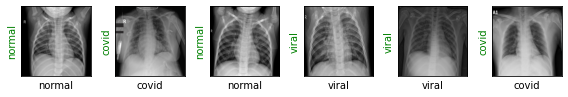

Eğitim Aşaması :  220
Kayıp (Val. Loss): 0.1019, Doğruluk (Accuracy): 0.9667


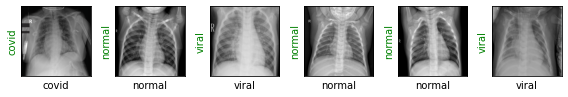

Eğitim Aşaması :  240
Kayıp (Val. Loss): 0.1568, Doğruluk (Accuracy): 0.9444


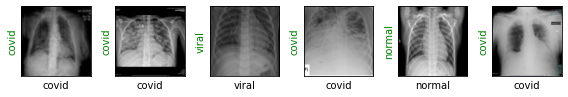

Eğitim Aşaması :  260
Kayıp (Val. Loss): 0.1140, Doğruluk (Accuracy): 0.9667


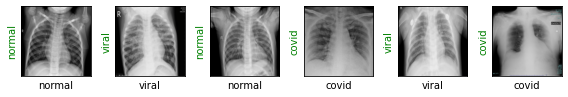

Eğitim Aşaması :  280
Kayıp (Val. Loss): 0.2078, Doğruluk (Accuracy): 0.9444


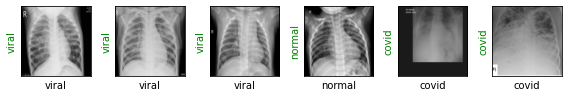

Eğitim Aşaması :  300
Kayıp (Val. Loss): 0.1067, Doğruluk (Accuracy): 0.9667


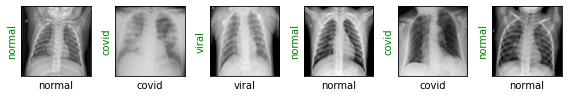

Eğitim Aşaması :  320
Kayıp (Val. Loss): 0.1705, Doğruluk (Accuracy): 0.9444


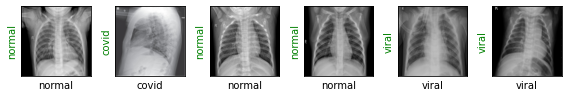

Eğitim Aşaması :  340
Kayıp (Val. Loss): 0.1531, Doğruluk (Accuracy): 0.9444


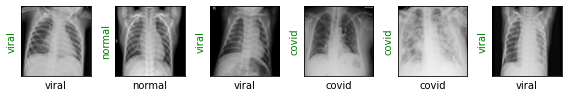

Eğitim Aşaması :  360
Kayıp (Val. Loss): 0.2425, Doğruluk (Accuracy): 0.9222


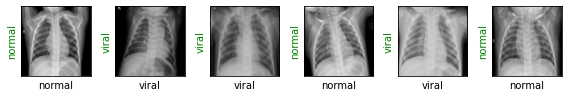

Eğitim Aşaması :  380
Kayıp (Val. Loss): 0.1389, Doğruluk (Accuracy): 0.9556


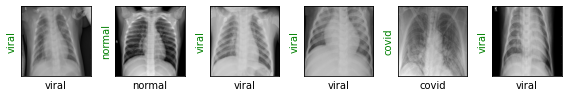

Eğitim Aşaması :  400
Kayıp (Val. Loss): 0.1140, Doğruluk (Accuracy): 0.9333


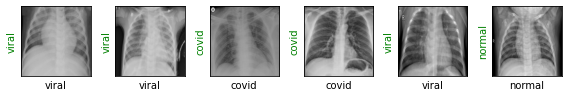

Eğitim Aşaması :  420
Kayıp (Val. Loss): 0.0702, Doğruluk (Accuracy): 0.9778


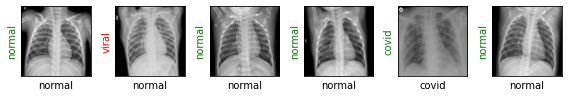

Eğitim Aşaması :  440
Kayıp (Val. Loss): 0.1060, Doğruluk (Accuracy): 0.9889


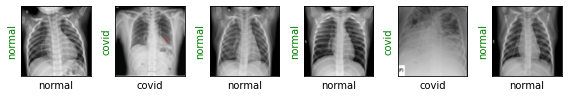

Eğitim Aşaması :  460
Kayıp (Val. Loss): 0.1414, Doğruluk (Accuracy): 0.9556


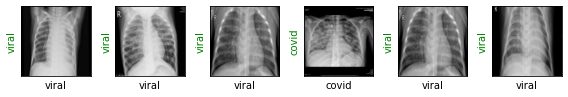

Eğitim Kayıbı (Training Loss) : 0.1605
Epoch başlatılıyor :, 2/10
Eğitim Aşaması :  0
Kayıp (Val. Loss): 0.1411, Doğruluk (Accuracy): 0.9444


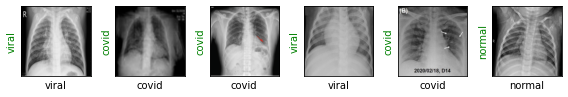

Eğitim Aşaması :  20
Kayıp (Val. Loss): 0.1392, Doğruluk (Accuracy): 0.9667


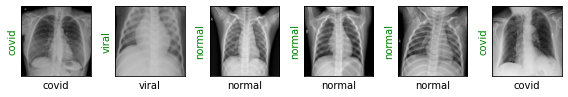

Eğitim Aşaması :  40
Kayıp (Val. Loss): 0.1711, Doğruluk (Accuracy): 0.9333


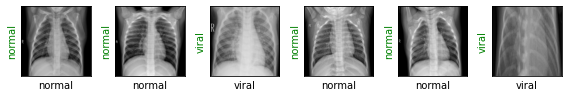

Eğitim Aşaması :  60
Kayıp (Val. Loss): 0.0923, Doğruluk (Accuracy): 0.9667


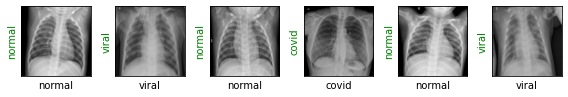

Eğitim Aşaması :  80
Kayıp (Val. Loss): 0.0994, Doğruluk (Accuracy): 0.9778


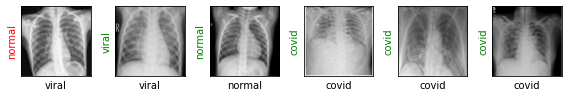

Eğitim Aşaması :  100
Kayıp (Val. Loss): 0.1555, Doğruluk (Accuracy): 0.9444


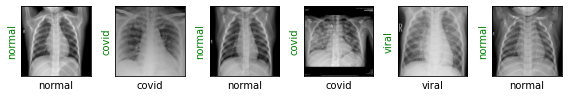

Eğitim Aşaması :  120
Kayıp (Val. Loss): 0.1466, Doğruluk (Accuracy): 0.9444


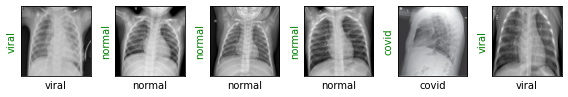

Eğitim Aşaması :  140
Kayıp (Val. Loss): 0.1756, Doğruluk (Accuracy): 0.9111


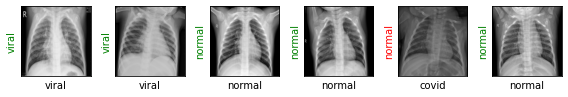

Eğitim Aşaması :  160
Kayıp (Val. Loss): 0.1363, Doğruluk (Accuracy): 0.9444


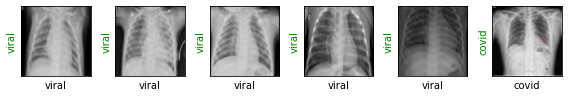

Eğitim Aşaması :  180
Kayıp (Val. Loss): 0.0765, Doğruluk (Accuracy): 0.9556


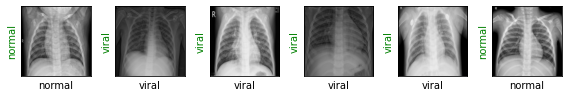

Eğitim Aşaması :  200
Kayıp (Val. Loss): 0.1787, Doğruluk (Accuracy): 0.9444


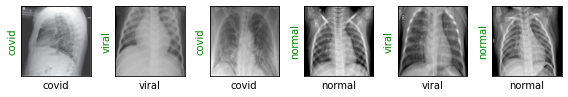

Eğitim Aşaması :  220
Kayıp (Val. Loss): 0.0821, Doğruluk (Accuracy): 0.9667


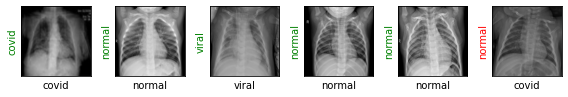

Eğitim Aşaması :  240
Kayıp (Val. Loss): 0.1158, Doğruluk (Accuracy): 0.9667


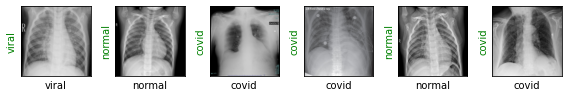

Eğitim Aşaması :  260
Kayıp (Val. Loss): 0.0617, Doğruluk (Accuracy): 0.9778


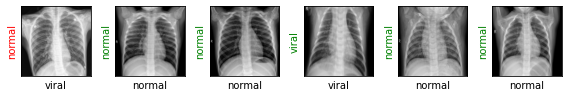

Eğitim Aşaması :  280
Kayıp (Val. Loss): 0.1446, Doğruluk (Accuracy): 0.9556


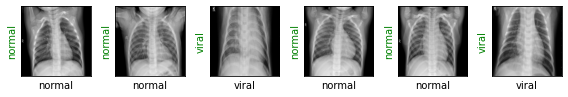

Eğitim Aşaması :  300
Kayıp (Val. Loss): 0.1146, Doğruluk (Accuracy): 0.9778


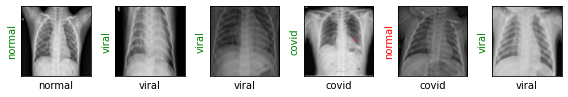

Eğitim Aşaması :  320
Kayıp (Val. Loss): 0.0878, Doğruluk (Accuracy): 0.9667


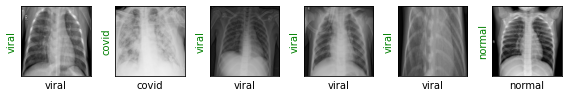

Eğitim Aşaması :  340
Kayıp (Val. Loss): 0.1050, Doğruluk (Accuracy): 0.9667


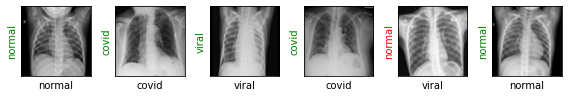

Eğitim Aşaması :  360
Kayıp (Val. Loss): 0.1942, Doğruluk (Accuracy): 0.9667


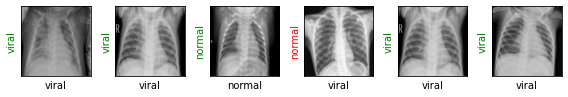

Eğitim Aşaması :  380
Kayıp (Val. Loss): 0.1568, Doğruluk (Accuracy): 0.9556


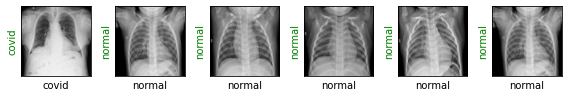

Eğitim Aşaması :  400
Kayıp (Val. Loss): 0.1867, Doğruluk (Accuracy): 0.9333


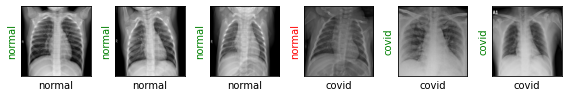

Eğitim Aşaması :  420
Kayıp (Val. Loss): 0.2535, Doğruluk (Accuracy): 0.9333


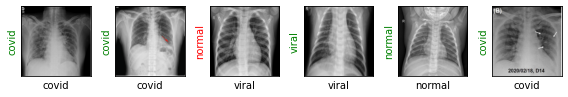

Eğitim Aşaması :  440
Kayıp (Val. Loss): 0.1011, Doğruluk (Accuracy): 0.9667


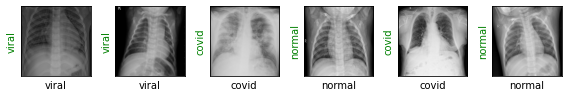

Eğitim Aşaması :  460
Kayıp (Val. Loss): 0.0960, Doğruluk (Accuracy): 0.9667


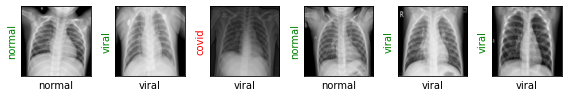

Eğitim Kayıbı (Training Loss) : 0.0960
Epoch başlatılıyor :, 3/10
Eğitim Aşaması :  0
Kayıp (Val. Loss): 0.1498, Doğruluk (Accuracy): 0.9333


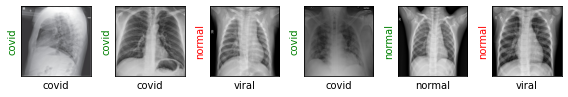

Eğitim Aşaması :  20
Kayıp (Val. Loss): 0.1330, Doğruluk (Accuracy): 0.9556


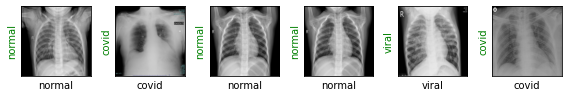

Eğitim Aşaması :  40
Kayıp (Val. Loss): 0.0676, Doğruluk (Accuracy): 0.9889


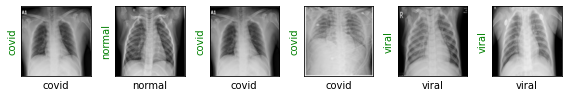

Eğitim Aşaması :  60
Kayıp (Val. Loss): 0.1286, Doğruluk (Accuracy): 0.9556


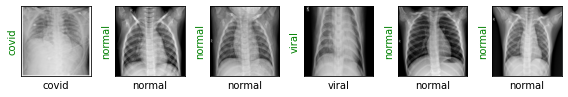

Eğitim Aşaması :  80
Kayıp (Val. Loss): 0.1635, Doğruluk (Accuracy): 0.9333


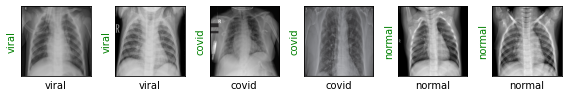

Eğitim Aşaması :  100
Kayıp (Val. Loss): 0.0984, Doğruluk (Accuracy): 0.9556


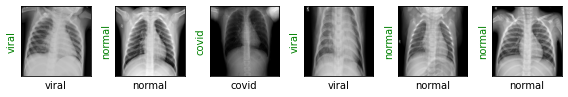

Eğitim Aşaması :  120
Kayıp (Val. Loss): 0.2209, Doğruluk (Accuracy): 0.9222


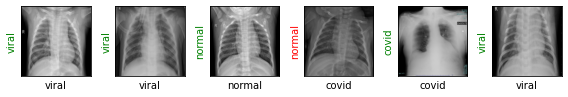

Eğitim Aşaması :  140
Kayıp (Val. Loss): 0.2200, Doğruluk (Accuracy): 0.9111


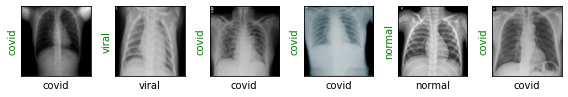

Eğitim Aşaması :  160
Kayıp (Val. Loss): 0.1966, Doğruluk (Accuracy): 0.9333


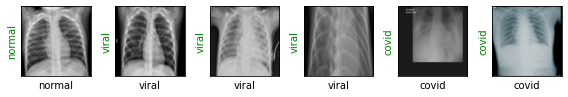

Eğitim Aşaması :  180
Kayıp (Val. Loss): 0.0697, Doğruluk (Accuracy): 0.9889


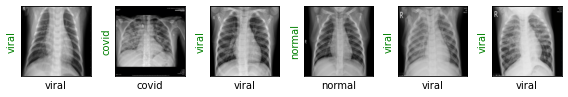

Eğitim Aşaması :  200
Kayıp (Val. Loss): 0.1035, Doğruluk (Accuracy): 0.9667


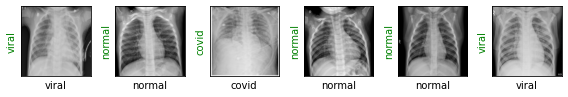

Eğitim Aşaması :  220
Kayıp (Val. Loss): 0.0772, Doğruluk (Accuracy): 0.9889


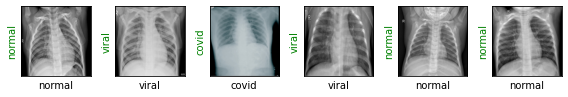

Eğitim Aşaması :  240
Kayıp (Val. Loss): 0.2086, Doğruluk (Accuracy): 0.9222


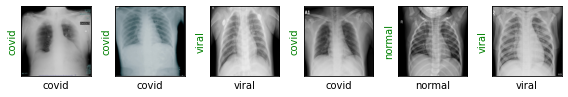

Eğitim Aşaması :  260
Kayıp (Val. Loss): 0.0984, Doğruluk (Accuracy): 0.9667


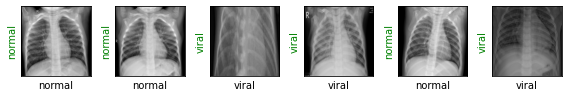

Eğitim Aşaması :  280
Kayıp (Val. Loss): 0.1676, Doğruluk (Accuracy): 0.9556


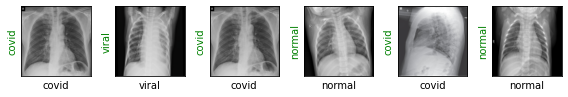

Eğitim Aşaması :  300
Kayıp (Val. Loss): 0.0941, Doğruluk (Accuracy): 0.9778


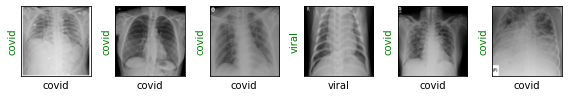

Eğitim Aşaması :  320
Kayıp (Val. Loss): 0.2214, Doğruluk (Accuracy): 0.9556


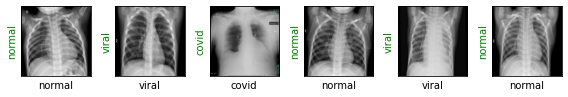

Eğitim Aşaması :  340
Kayıp (Val. Loss): 0.1943, Doğruluk (Accuracy): 0.9444


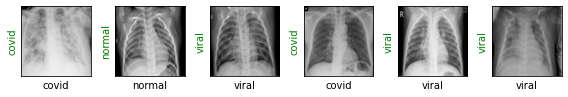

Eğitim Aşaması :  360
Kayıp (Val. Loss): 0.0786, Doğruluk (Accuracy): 0.9889


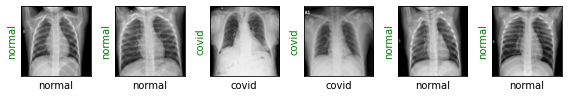

Eğitim Aşaması :  380
Kayıp (Val. Loss): 0.1438, Doğruluk (Accuracy): 0.9333


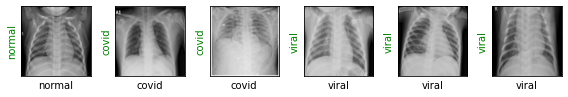

Eğitim Aşaması :  400
Kayıp (Val. Loss): 0.1634, Doğruluk (Accuracy): 0.9444


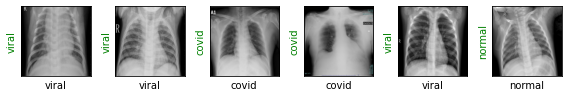

Eğitim Aşaması :  420
Kayıp (Val. Loss): 0.1376, Doğruluk (Accuracy): 0.9556


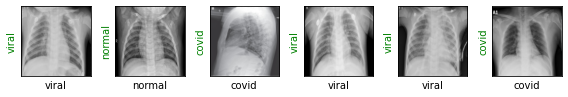

Eğitim Aşaması :  440
Kayıp (Val. Loss): 0.1241, Doğruluk (Accuracy): 0.9778


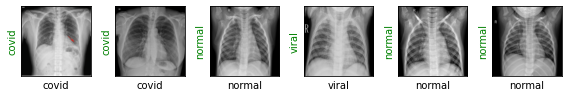

Eğitim Aşaması :  460
Kayıp (Val. Loss): 0.1092, Doğruluk (Accuracy): 0.9778


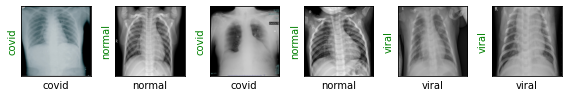

Eğitim Kayıbı (Training Loss) : 0.0634
Epoch başlatılıyor :, 4/10
Eğitim Aşaması :  0
Kayıp (Val. Loss): 0.1526, Doğruluk (Accuracy): 0.9667


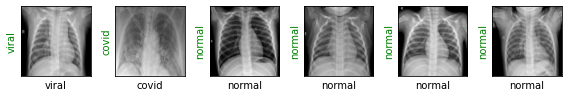

Eğitim Aşaması :  20
Kayıp (Val. Loss): 0.1351, Doğruluk (Accuracy): 0.9667


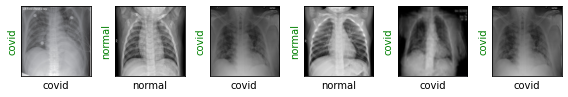

Eğitim Aşaması :  40
Kayıp (Val. Loss): 0.0643, Doğruluk (Accuracy): 0.9667


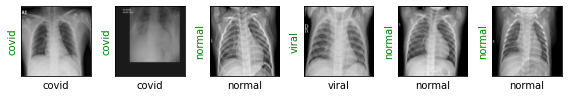

Eğitim Aşaması :  60
Kayıp (Val. Loss): 0.1183, Doğruluk (Accuracy): 0.9444


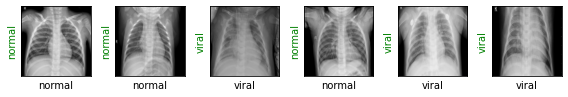

Eğitim Aşaması :  80
Kayıp (Val. Loss): 0.0522, Doğruluk (Accuracy): 0.9889


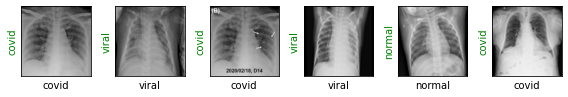

Eğitim Aşaması :  100
Kayıp (Val. Loss): 0.2621, Doğruluk (Accuracy): 0.9333


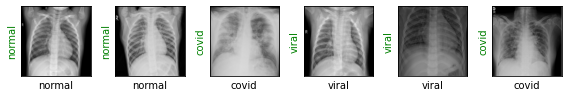

Eğitim Aşaması :  120
Kayıp (Val. Loss): 0.4450, Doğruluk (Accuracy): 0.8778


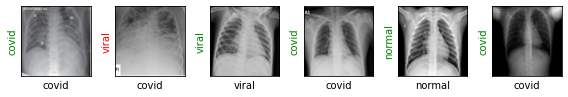

Eğitim Aşaması :  140
Kayıp (Val. Loss): 0.2777, Doğruluk (Accuracy): 0.9222


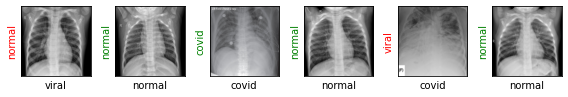

Eğitim Aşaması :  160
Kayıp (Val. Loss): 0.1814, Doğruluk (Accuracy): 0.9333


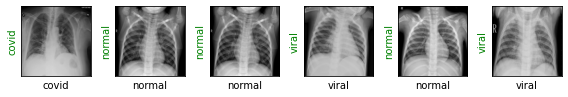

Eğitim Aşaması :  180
Kayıp (Val. Loss): 0.0926, Doğruluk (Accuracy): 0.9778


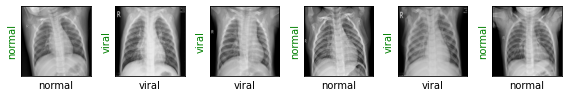

Eğitim Aşaması :  200
Kayıp (Val. Loss): 0.1945, Doğruluk (Accuracy): 0.9222


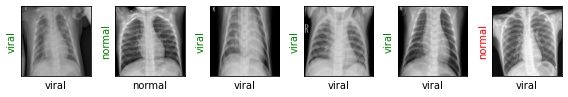

Eğitim Aşaması :  220
Kayıp (Val. Loss): 0.0975, Doğruluk (Accuracy): 0.9667


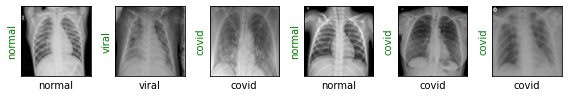

Eğitim Aşaması :  240
Kayıp (Val. Loss): 0.1805, Doğruluk (Accuracy): 0.9556


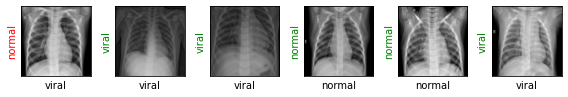

Eğitim Aşaması :  260
Kayıp (Val. Loss): 0.1623, Doğruluk (Accuracy): 0.9667


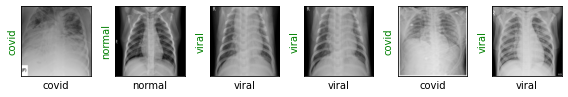

Eğitim Aşaması :  280
Kayıp (Val. Loss): 0.4152, Doğruluk (Accuracy): 0.9222


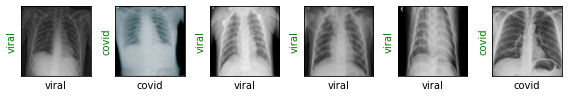

Eğitim Aşaması :  300
Kayıp (Val. Loss): 0.1382, Doğruluk (Accuracy): 0.9667


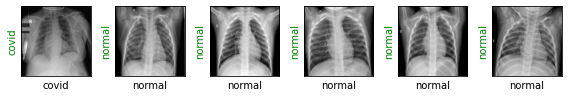

Eğitim Aşaması :  320
Kayıp (Val. Loss): 0.2287, Doğruluk (Accuracy): 0.9667


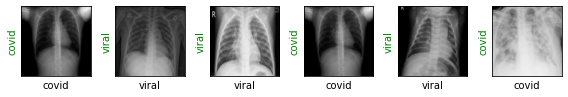

Eğitim Aşaması :  340
Kayıp (Val. Loss): 0.1153, Doğruluk (Accuracy): 0.9778


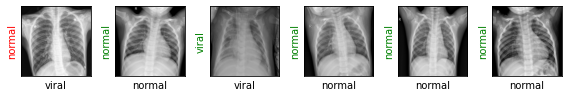

Eğitim Aşaması :  360
Kayıp (Val. Loss): 0.1315, Doğruluk (Accuracy): 0.9778


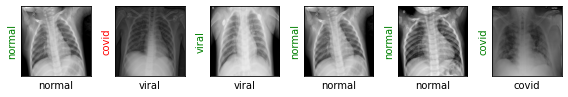

Eğitim Aşaması :  380
Kayıp (Val. Loss): 0.2532, Doğruluk (Accuracy): 0.9556


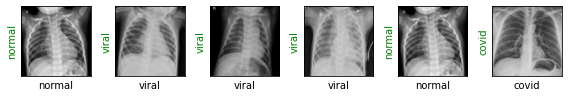

Eğitim Aşaması :  400
Kayıp (Val. Loss): 0.1145, Doğruluk (Accuracy): 0.9778


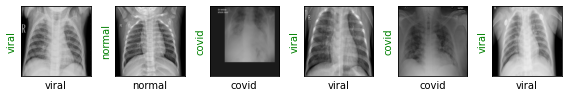

Eğitim Aşaması :  420
Kayıp (Val. Loss): 0.1691, Doğruluk (Accuracy): 0.9556


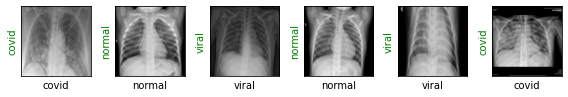

Eğitim Aşaması :  440
Kayıp (Val. Loss): 0.1655, Doğruluk (Accuracy): 0.9667


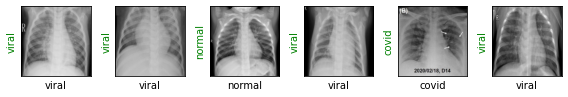

Eğitim Aşaması :  460
Kayıp (Val. Loss): 0.0299, Doğruluk (Accuracy): 1.0000


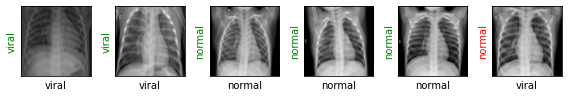

Eğitim Kayıbı (Training Loss) : 0.0578
Epoch başlatılıyor :, 5/10
Eğitim Aşaması :  0
Kayıp (Val. Loss): 0.2660, Doğruluk (Accuracy): 0.9444


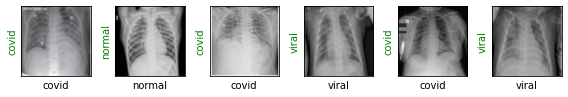

Eğitim Aşaması :  20
Kayıp (Val. Loss): 0.0511, Doğruluk (Accuracy): 0.9889


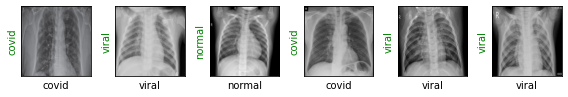

Eğitim Aşaması :  40
Kayıp (Val. Loss): 0.1277, Doğruluk (Accuracy): 0.9667


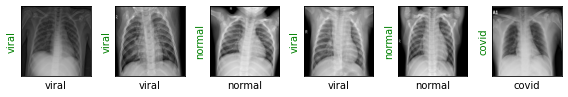

Eğitim Aşaması :  60
Kayıp (Val. Loss): 0.2078, Doğruluk (Accuracy): 0.9556


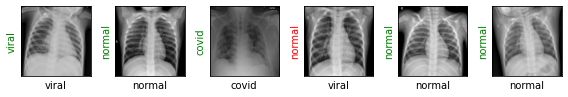

Eğitim Aşaması :  80
Kayıp (Val. Loss): 0.2096, Doğruluk (Accuracy): 0.9556


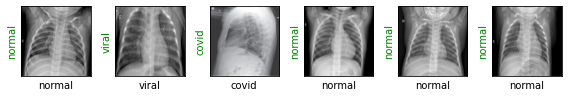

Eğitim Aşaması :  100
Kayıp (Val. Loss): 0.1493, Doğruluk (Accuracy): 0.9556


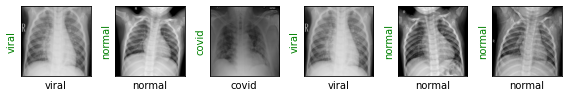

Eğitim Aşaması :  120
Kayıp (Val. Loss): 0.1133, Doğruluk (Accuracy): 0.9778


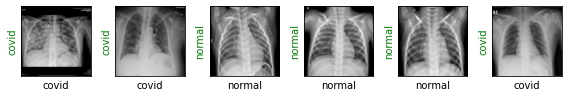

Eğitim Aşaması :  140
Kayıp (Val. Loss): 0.1485, Doğruluk (Accuracy): 0.9556


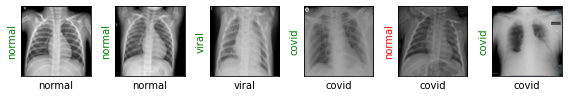

Eğitim Aşaması :  160
Kayıp (Val. Loss): 0.1455, Doğruluk (Accuracy): 0.9556


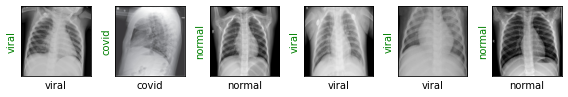

Eğitim Aşaması :  180
Kayıp (Val. Loss): 0.1123, Doğruluk (Accuracy): 0.9667


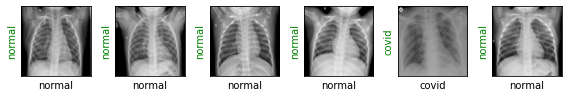

Eğitim Aşaması :  200
Kayıp (Val. Loss): 0.1348, Doğruluk (Accuracy): 0.9667


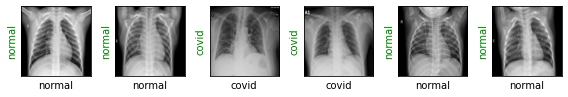

Eğitim Aşaması :  220
Kayıp (Val. Loss): 0.2830, Doğruluk (Accuracy): 0.9556


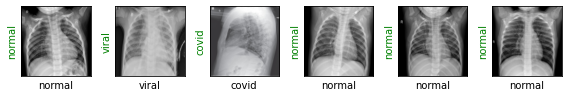

Eğitim Aşaması :  240
Kayıp (Val. Loss): 0.1949, Doğruluk (Accuracy): 0.9667


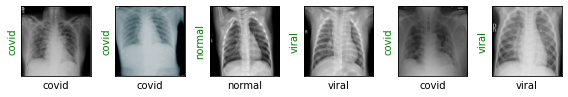

Eğitim Aşaması :  260
Kayıp (Val. Loss): 0.2195, Doğruluk (Accuracy): 0.9667


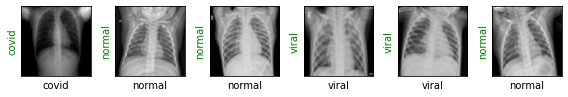

Eğitim Aşaması :  280
Kayıp (Val. Loss): 0.2077, Doğruluk (Accuracy): 0.9444


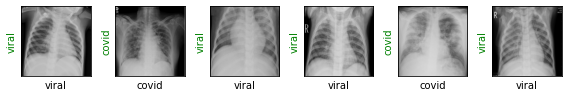

Eğitim Aşaması :  300
Kayıp (Val. Loss): 0.0905, Doğruluk (Accuracy): 0.9889


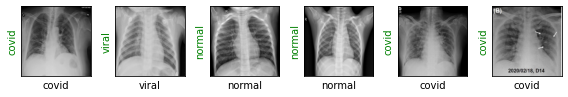

Eğitim Aşaması :  320
Kayıp (Val. Loss): 0.1581, Doğruluk (Accuracy): 0.9556


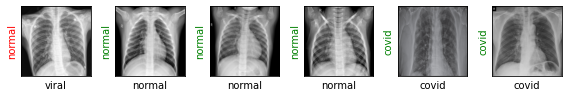

Eğitim Aşaması :  340
Kayıp (Val. Loss): 0.1105, Doğruluk (Accuracy): 0.9778


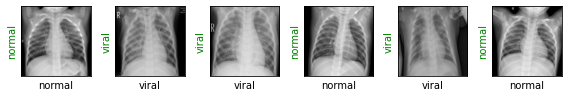

Eğitim Aşaması :  360
Kayıp (Val. Loss): 0.0753, Doğruluk (Accuracy): 0.9889


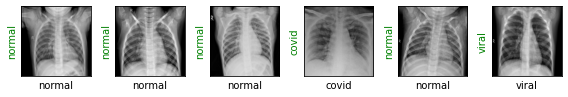

Eğitim Aşaması :  380
Kayıp (Val. Loss): 0.2558, Doğruluk (Accuracy): 0.9333


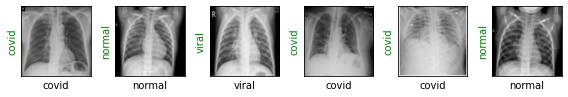

Eğitim Aşaması :  400
Kayıp (Val. Loss): 0.1117, Doğruluk (Accuracy): 0.9444


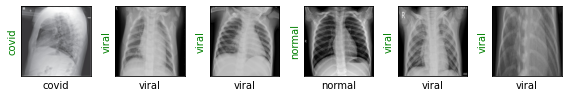

Eğitim Aşaması :  420
Kayıp (Val. Loss): 0.2063, Doğruluk (Accuracy): 0.9667


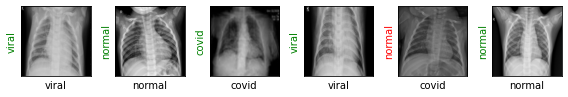

Eğitim Aşaması :  440
Kayıp (Val. Loss): 0.0724, Doğruluk (Accuracy): 0.9889


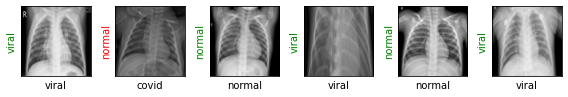

Eğitim Aşaması :  460
Kayıp (Val. Loss): 0.4017, Doğruluk (Accuracy): 0.9111


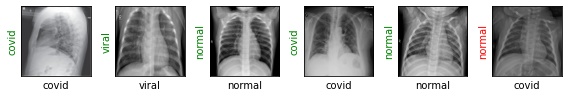

Eğitim Kayıbı (Training Loss) : 0.0429
Epoch başlatılıyor :, 6/10
Eğitim Aşaması :  0
Kayıp (Val. Loss): 0.3086, Doğruluk (Accuracy): 0.9111


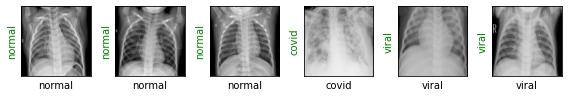

Eğitim Aşaması :  20
Kayıp (Val. Loss): 0.2174, Doğruluk (Accuracy): 0.9556


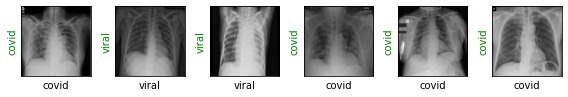

Eğitim Aşaması :  40
Kayıp (Val. Loss): 0.2383, Doğruluk (Accuracy): 0.9556


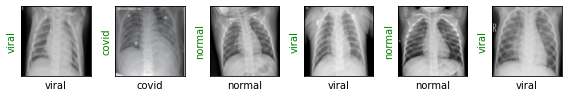

Eğitim Aşaması :  60
Kayıp (Val. Loss): 0.1116, Doğruluk (Accuracy): 0.9444


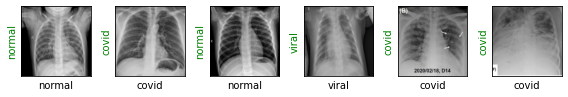

Eğitim Aşaması :  80
Kayıp (Val. Loss): 0.1654, Doğruluk (Accuracy): 0.9556


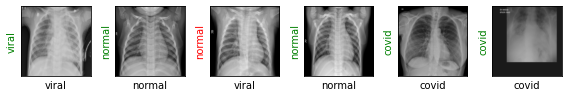

Eğitim Aşaması :  100
Kayıp (Val. Loss): 0.1407, Doğruluk (Accuracy): 0.9667


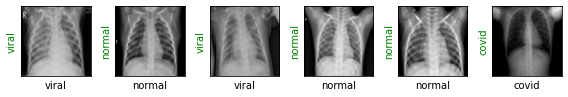

Eğitim Aşaması :  120
Kayıp (Val. Loss): 0.0711, Doğruluk (Accuracy): 0.9667


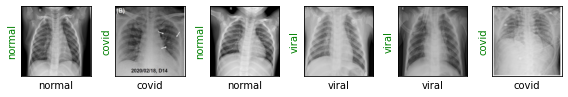

Eğitim Aşaması :  140
Kayıp (Val. Loss): 0.0637, Doğruluk (Accuracy): 0.9667


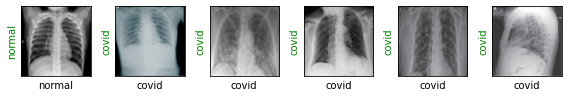

Eğitim Aşaması :  160
Kayıp (Val. Loss): 0.1747, Doğruluk (Accuracy): 0.9444


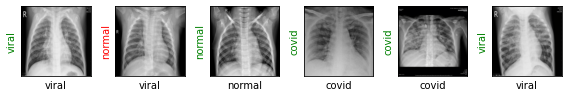

Eğitim Aşaması :  180
Kayıp (Val. Loss): 0.2281, Doğruluk (Accuracy): 0.9444


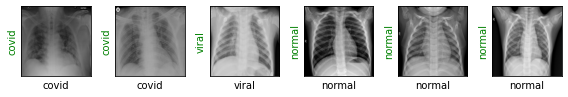

Eğitim Aşaması :  200
Kayıp (Val. Loss): 0.0711, Doğruluk (Accuracy): 0.9889


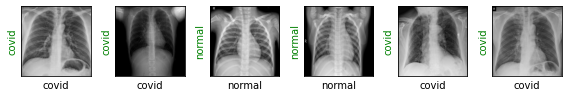

Eğitim Aşaması :  220
Kayıp (Val. Loss): 0.1160, Doğruluk (Accuracy): 0.9778


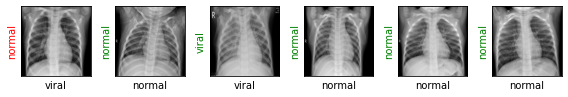

Eğitim Aşaması :  240
Kayıp (Val. Loss): 0.0405, Doğruluk (Accuracy): 0.9889


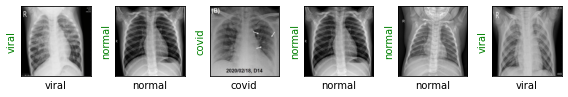

Eğitim Aşaması :  260
Kayıp (Val. Loss): 0.2350, Doğruluk (Accuracy): 0.9556


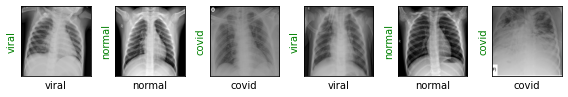

Eğitim Aşaması :  280
Kayıp (Val. Loss): 0.0650, Doğruluk (Accuracy): 0.9889


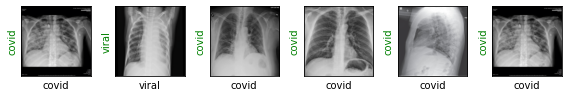

Eğitim Aşaması :  300
Kayıp (Val. Loss): 0.2211, Doğruluk (Accuracy): 0.9444


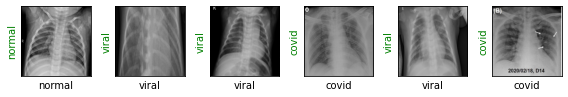

Eğitim Aşaması :  320
Kayıp (Val. Loss): 0.1257, Doğruluk (Accuracy): 0.9778


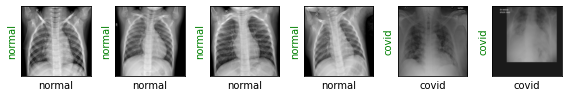

Eğitim Aşaması :  340
Kayıp (Val. Loss): 0.1585, Doğruluk (Accuracy): 0.9667


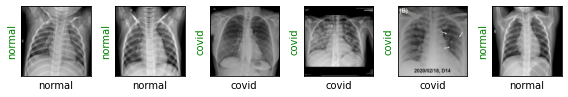

Eğitim Aşaması :  360
Kayıp (Val. Loss): 0.3680, Doğruluk (Accuracy): 0.9222


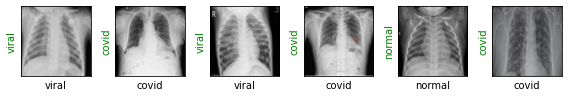

Eğitim Aşaması :  380
Kayıp (Val. Loss): 0.2980, Doğruluk (Accuracy): 0.9444


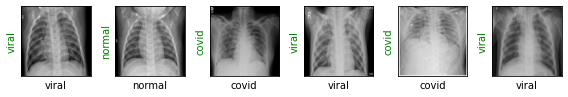

Eğitim Aşaması :  400
Kayıp (Val. Loss): 0.1639, Doğruluk (Accuracy): 0.9667


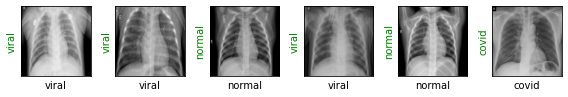

Eğitim Aşaması :  420
Kayıp (Val. Loss): 0.1955, Doğruluk (Accuracy): 0.9556


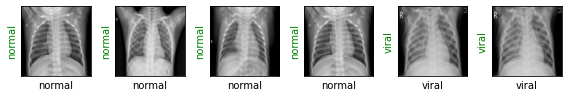

Eğitim Aşaması :  440
Kayıp (Val. Loss): 0.2809, Doğruluk (Accuracy): 0.9444


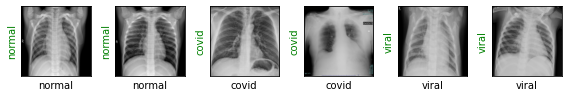

Eğitim Aşaması :  460
Kayıp (Val. Loss): 0.0814, Doğruluk (Accuracy): 0.9889


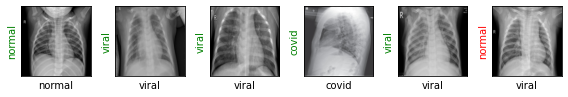

Eğitim Kayıbı (Training Loss) : 0.0417
Epoch başlatılıyor :, 7/10
Eğitim Aşaması :  0
Kayıp (Val. Loss): 0.1995, Doğruluk (Accuracy): 0.9444


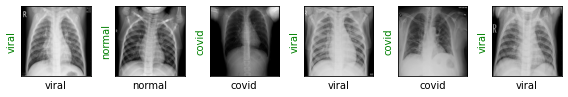

Eğitim Aşaması :  20
Kayıp (Val. Loss): 0.3415, Doğruluk (Accuracy): 0.9222


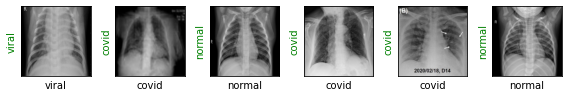

Eğitim Aşaması :  40
Kayıp (Val. Loss): 0.1919, Doğruluk (Accuracy): 0.9556


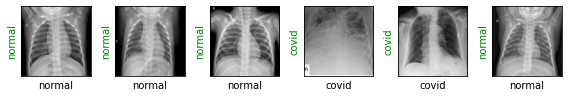

Eğitim Aşaması :  60
Kayıp (Val. Loss): 0.0894, Doğruluk (Accuracy): 0.9667


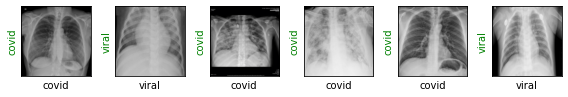

Eğitim Aşaması :  80
Kayıp (Val. Loss): 0.2730, Doğruluk (Accuracy): 0.9444


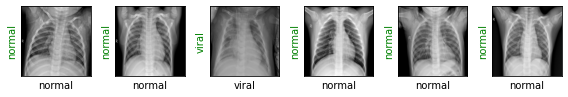

Eğitim Aşaması :  100
Kayıp (Val. Loss): 0.2366, Doğruluk (Accuracy): 0.9667


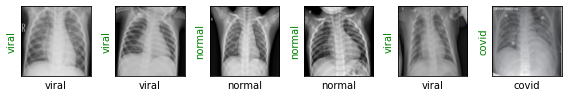

Eğitim Aşaması :  120
Kayıp (Val. Loss): 0.2489, Doğruluk (Accuracy): 0.9556


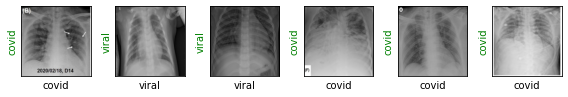

Eğitim Aşaması :  140
Kayıp (Val. Loss): 0.1880, Doğruluk (Accuracy): 0.9556


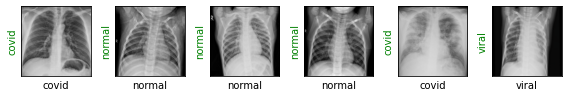

Eğitim Aşaması :  160
Kayıp (Val. Loss): 0.2095, Doğruluk (Accuracy): 0.9556


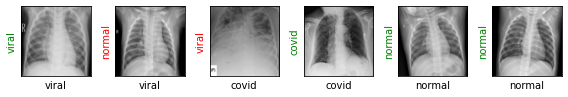

Eğitim Aşaması :  180
Kayıp (Val. Loss): 0.2577, Doğruluk (Accuracy): 0.9556


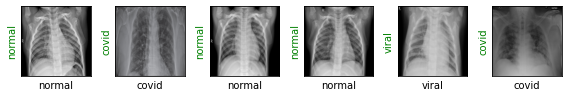

Eğitim Aşaması :  200
Kayıp (Val. Loss): 0.4079, Doğruluk (Accuracy): 0.9333


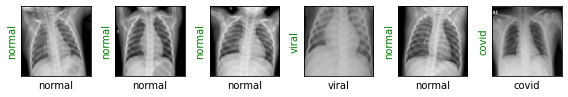

Eğitim Aşaması :  220
Kayıp (Val. Loss): 0.0691, Doğruluk (Accuracy): 0.9778


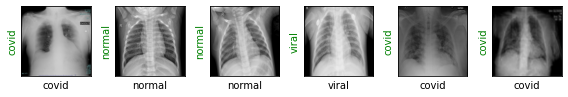

Eğitim Aşaması :  240
Kayıp (Val. Loss): 0.1705, Doğruluk (Accuracy): 0.9333


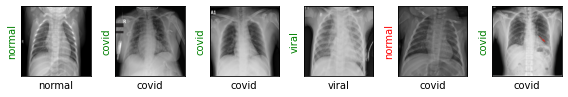

Eğitim Aşaması :  260
Kayıp (Val. Loss): 0.2707, Doğruluk (Accuracy): 0.9333


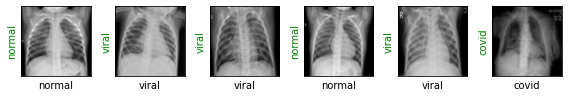

Eğitim Aşaması :  280
Kayıp (Val. Loss): 0.1979, Doğruluk (Accuracy): 0.9333


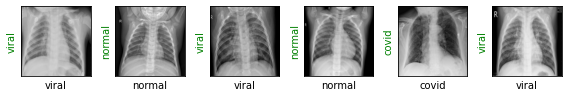

Eğitim Aşaması :  300
Kayıp (Val. Loss): 0.2716, Doğruluk (Accuracy): 0.9333


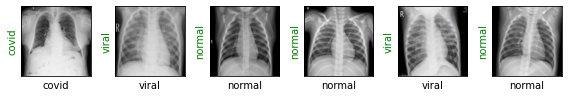

Eğitim Aşaması :  320
Kayıp (Val. Loss): 0.0709, Doğruluk (Accuracy): 0.9778


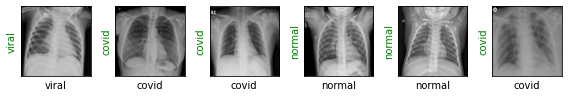

Eğitim Aşaması :  340
Kayıp (Val. Loss): 0.1850, Doğruluk (Accuracy): 0.9556


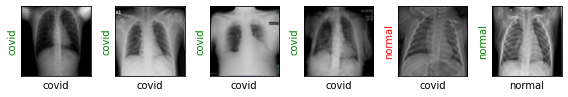

Eğitim Aşaması :  360
Kayıp (Val. Loss): 0.1195, Doğruluk (Accuracy): 0.9778


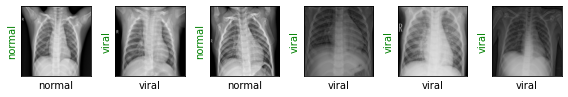

Eğitim Aşaması :  380
Kayıp (Val. Loss): 0.1508, Doğruluk (Accuracy): 0.9667


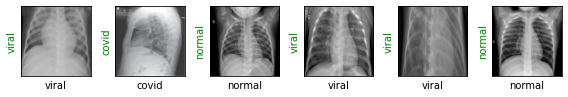

Eğitim Aşaması :  400
Kayıp (Val. Loss): 0.1681, Doğruluk (Accuracy): 0.9667


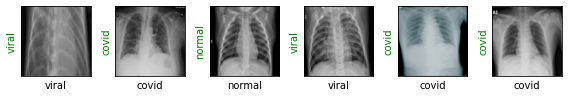

Eğitim Aşaması :  420
Kayıp (Val. Loss): 0.0267, Doğruluk (Accuracy): 1.0000


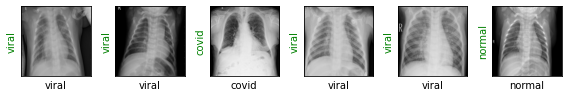

Eğitim Aşaması :  440
Kayıp (Val. Loss): 0.2216, Doğruluk (Accuracy): 0.9667


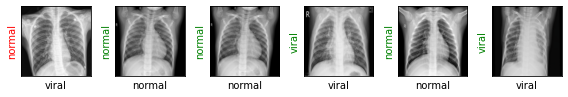

Eğitim Aşaması :  460
Kayıp (Val. Loss): 0.2206, Doğruluk (Accuracy): 0.9556


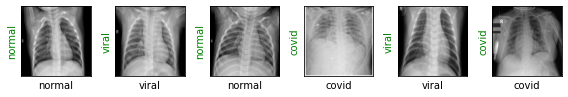

Eğitim Kayıbı (Training Loss) : 0.0232
Epoch başlatılıyor :, 8/10
Eğitim Aşaması :  0
Kayıp (Val. Loss): 0.0434, Doğruluk (Accuracy): 0.9889


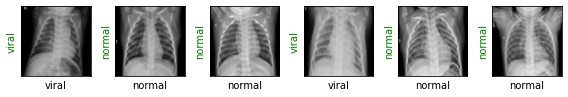

Eğitim Aşaması :  20
Kayıp (Val. Loss): 0.2999, Doğruluk (Accuracy): 0.9333


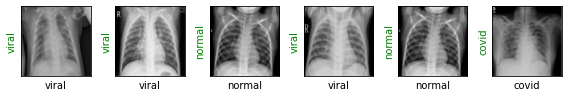

Eğitim Aşaması :  40
Kayıp (Val. Loss): 0.1846, Doğruluk (Accuracy): 0.9667


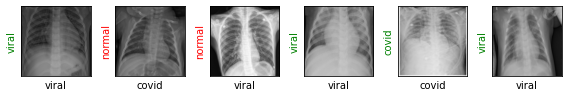

Eğitim Aşaması :  60
Kayıp (Val. Loss): 0.1811, Doğruluk (Accuracy): 0.9556


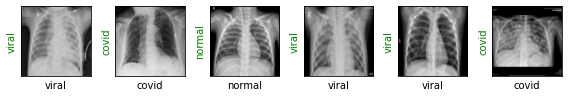

Eğitim Aşaması :  80
Kayıp (Val. Loss): 0.2673, Doğruluk (Accuracy): 0.9111


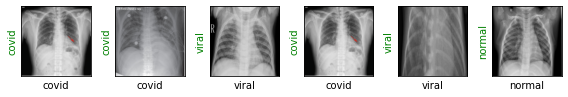

Eğitim Aşaması :  100
Kayıp (Val. Loss): 0.0559, Doğruluk (Accuracy): 0.9889


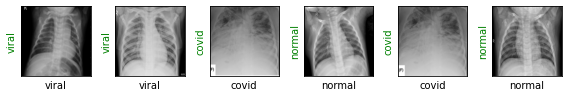

Eğitim Aşaması :  120
Kayıp (Val. Loss): 0.1458, Doğruluk (Accuracy): 0.9667


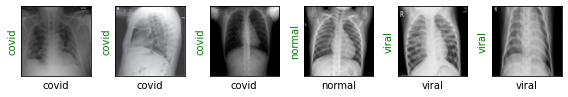

Eğitim Aşaması :  140
Kayıp (Val. Loss): 0.0738, Doğruluk (Accuracy): 0.9778


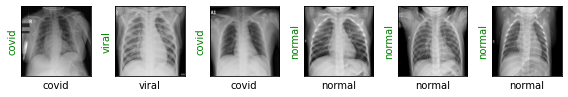

Eğitim Aşaması :  160
Kayıp (Val. Loss): 0.2809, Doğruluk (Accuracy): 0.9222


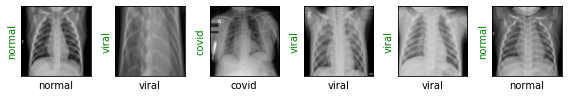

Eğitim Aşaması :  180
Kayıp (Val. Loss): 0.1308, Doğruluk (Accuracy): 0.9889


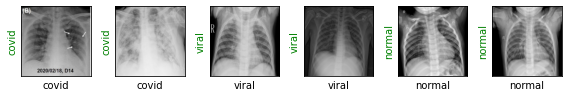

Eğitim Aşaması :  200
Kayıp (Val. Loss): 0.1725, Doğruluk (Accuracy): 0.9556


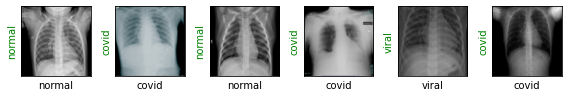

Eğitim Aşaması :  220
Kayıp (Val. Loss): 0.2207, Doğruluk (Accuracy): 0.9667


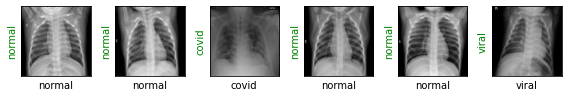

Eğitim Aşaması :  240
Kayıp (Val. Loss): 0.0794, Doğruluk (Accuracy): 0.9778


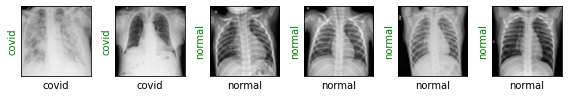

Eğitim Aşaması :  260
Kayıp (Val. Loss): 0.1274, Doğruluk (Accuracy): 0.9667


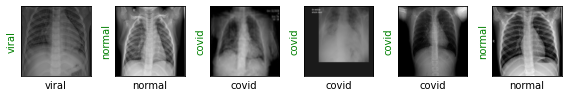

Eğitim Aşaması :  280
Kayıp (Val. Loss): 0.1530, Doğruluk (Accuracy): 0.9556


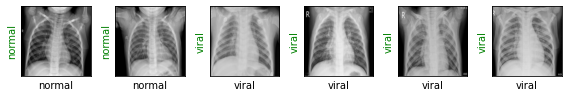

Eğitim Aşaması :  300
Kayıp (Val. Loss): 0.1149, Doğruluk (Accuracy): 0.9667


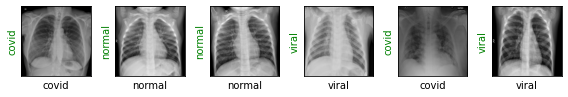

Eğitim Aşaması :  320
Kayıp (Val. Loss): 0.0796, Doğruluk (Accuracy): 0.9667


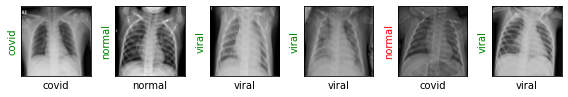

Eğitim Aşaması :  340
Kayıp (Val. Loss): 0.2030, Doğruluk (Accuracy): 0.9333


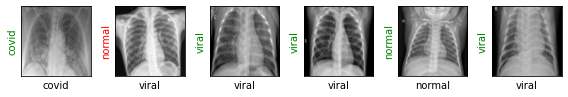

Eğitim Aşaması :  360
Kayıp (Val. Loss): 0.1003, Doğruluk (Accuracy): 0.9889


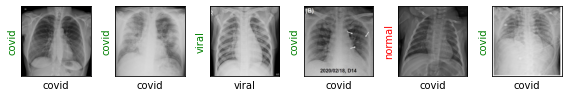

Eğitim Aşaması :  380
Kayıp (Val. Loss): 0.2226, Doğruluk (Accuracy): 0.9222


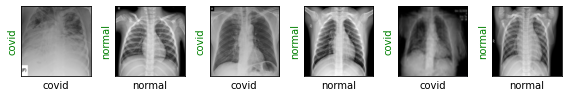

Eğitim Aşaması :  400
Kayıp (Val. Loss): 0.2610, Doğruluk (Accuracy): 0.9667


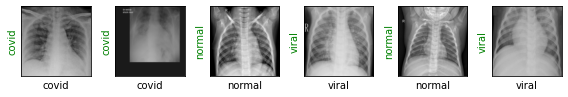

Eğitim Aşaması :  420
Kayıp (Val. Loss): 0.0349, Doğruluk (Accuracy): 1.0000


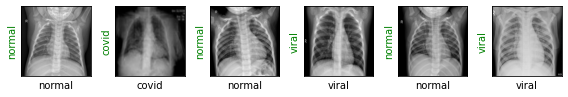

Eğitim Aşaması :  440
Kayıp (Val. Loss): 0.2770, Doğruluk (Accuracy): 0.9444


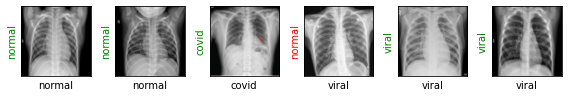

Eğitim Aşaması :  460
Kayıp (Val. Loss): 0.2315, Doğruluk (Accuracy): 0.9667


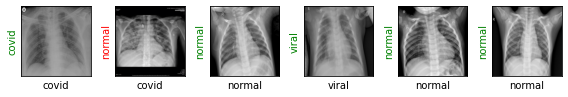

Eğitim Kayıbı (Training Loss) : 0.0426
Epoch başlatılıyor :, 9/10
Eğitim Aşaması :  0
Kayıp (Val. Loss): 0.2523, Doğruluk (Accuracy): 0.9667


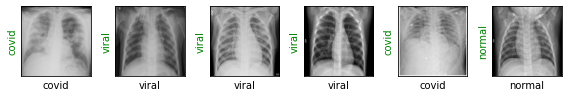

Eğitim Aşaması :  20
Kayıp (Val. Loss): 0.2678, Doğruluk (Accuracy): 0.9667


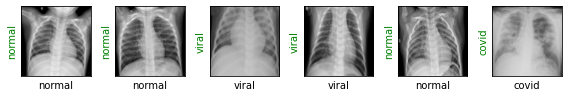

Eğitim Aşaması :  40
Kayıp (Val. Loss): 0.2716, Doğruluk (Accuracy): 0.9667


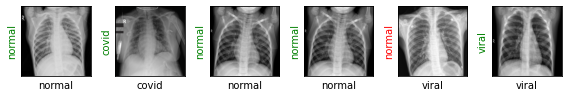

Eğitim Aşaması :  60
Kayıp (Val. Loss): 0.0463, Doğruluk (Accuracy): 1.0000


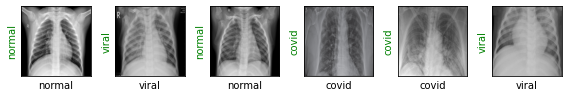

Eğitim Aşaması :  80
Kayıp (Val. Loss): 0.1200, Doğruluk (Accuracy): 0.9778


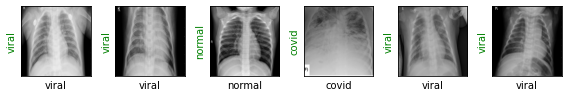

Eğitim Aşaması :  100
Kayıp (Val. Loss): 0.2064, Doğruluk (Accuracy): 0.9556


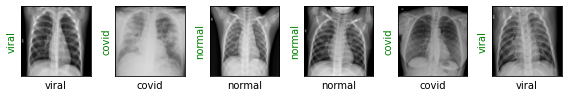

Eğitim Aşaması :  120
Kayıp (Val. Loss): 0.1130, Doğruluk (Accuracy): 0.9889


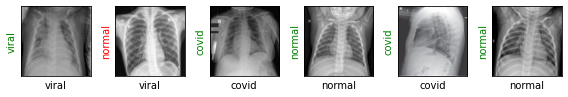

Eğitim Aşaması :  140
Kayıp (Val. Loss): 0.1074, Doğruluk (Accuracy): 0.9889


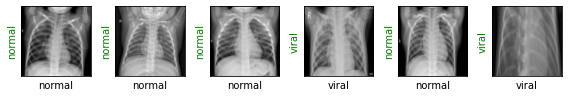

Eğitim Aşaması :  160
Kayıp (Val. Loss): 0.0857, Doğruluk (Accuracy): 0.9778


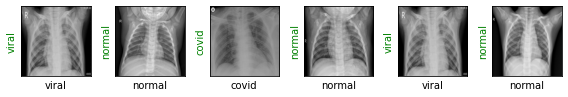

Eğitim Aşaması :  180
Kayıp (Val. Loss): 0.0399, Doğruluk (Accuracy): 0.9778


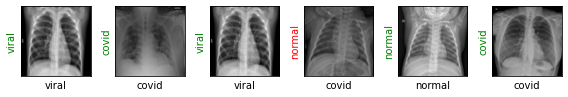

Eğitim Aşaması :  200
Kayıp (Val. Loss): 0.0495, Doğruluk (Accuracy): 0.9889


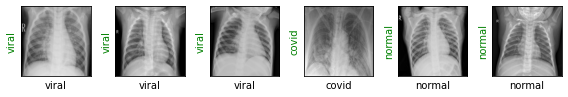

Eğitim Aşaması :  220
Kayıp (Val. Loss): 0.1730, Doğruluk (Accuracy): 0.9778


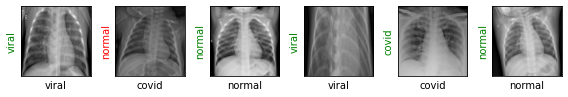

Eğitim Aşaması :  240
Kayıp (Val. Loss): 0.1128, Doğruluk (Accuracy): 0.9778


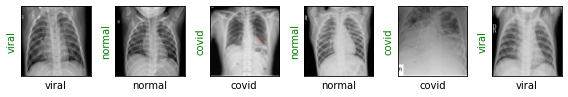

Eğitim Aşaması :  260
Kayıp (Val. Loss): 0.1200, Doğruluk (Accuracy): 0.9556


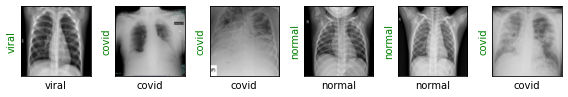

Eğitim Aşaması :  280
Kayıp (Val. Loss): 0.1115, Doğruluk (Accuracy): 0.9778


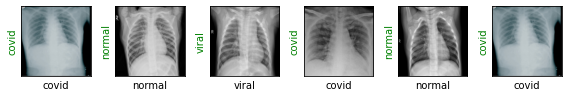

Eğitim Aşaması :  300
Kayıp (Val. Loss): 0.1187, Doğruluk (Accuracy): 0.9556


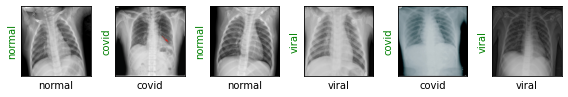

Eğitim Aşaması :  320
Kayıp (Val. Loss): 0.0560, Doğruluk (Accuracy): 0.9778


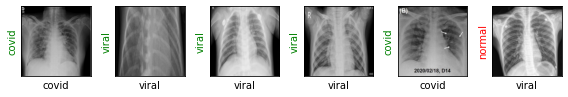

Eğitim Aşaması :  340
Kayıp (Val. Loss): 0.2108, Doğruluk (Accuracy): 0.9667


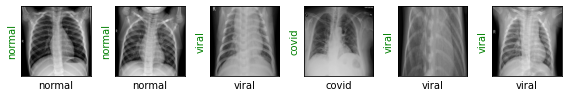

Eğitim Aşaması :  360
Kayıp (Val. Loss): 0.0877, Doğruluk (Accuracy): 0.9889


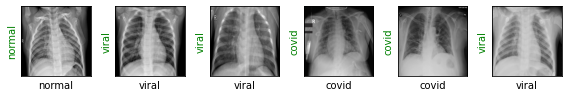

Eğitim Aşaması :  380
Kayıp (Val. Loss): 0.0604, Doğruluk (Accuracy): 0.9778


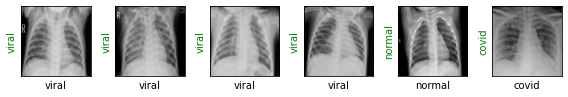

Eğitim Aşaması :  400
Kayıp (Val. Loss): 0.1583, Doğruluk (Accuracy): 0.9667


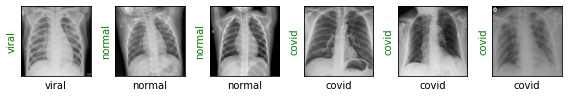

Eğitim Aşaması :  420
Kayıp (Val. Loss): 0.1445, Doğruluk (Accuracy): 0.9778


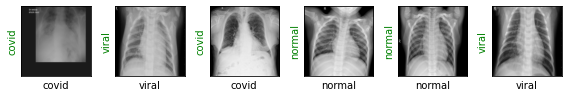

Eğitim Aşaması :  440
Kayıp (Val. Loss): 0.0865, Doğruluk (Accuracy): 0.9778


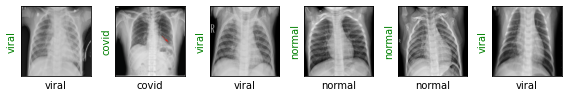

Eğitim Aşaması :  460
Kayıp (Val. Loss): 0.2085, Doğruluk (Accuracy): 0.9556


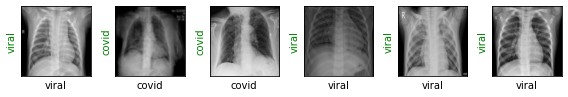

Eğitim Kayıbı (Training Loss) : 0.0314
Epoch başlatılıyor :, 10/10
Eğitim Aşaması :  0
Kayıp (Val. Loss): 0.1740, Doğruluk (Accuracy): 0.9667


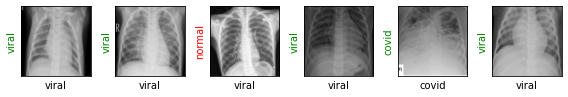

Eğitim Aşaması :  20
Kayıp (Val. Loss): 0.1229, Doğruluk (Accuracy): 0.9778


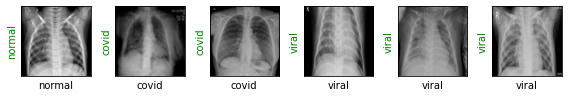

Eğitim Aşaması :  40
Kayıp (Val. Loss): 0.1184, Doğruluk (Accuracy): 0.9778


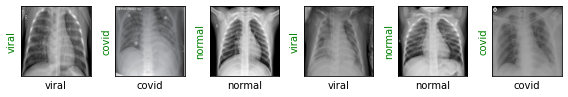

Eğitim Aşaması :  60
Kayıp (Val. Loss): 0.2167, Doğruluk (Accuracy): 0.9556


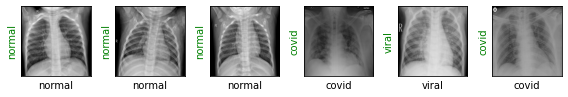

Eğitim Aşaması :  80
Kayıp (Val. Loss): 0.1487, Doğruluk (Accuracy): 0.9667


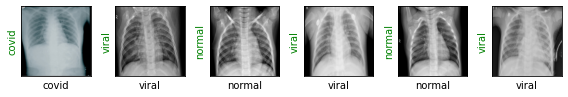

Eğitim Aşaması :  100
Kayıp (Val. Loss): 0.1366, Doğruluk (Accuracy): 0.9444


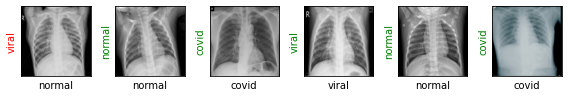

Eğitim Aşaması :  120
Kayıp (Val. Loss): 0.0546, Doğruluk (Accuracy): 0.9667


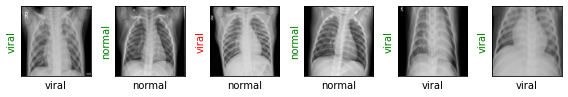

Eğitim Aşaması :  140
Kayıp (Val. Loss): 0.0878, Doğruluk (Accuracy): 0.9667


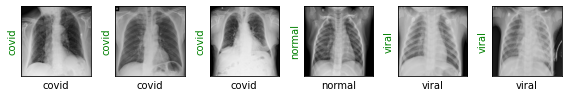

Eğitim Aşaması :  160
Kayıp (Val. Loss): 0.1201, Doğruluk (Accuracy): 0.9778


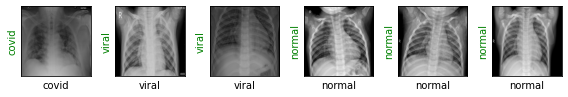

Eğitim Aşaması :  180
Kayıp (Val. Loss): 0.1207, Doğruluk (Accuracy): 0.9778


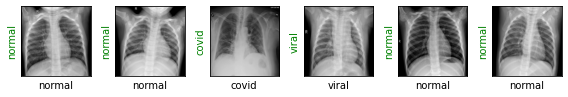

Eğitim Aşaması :  200
Kayıp (Val. Loss): 0.1635, Doğruluk (Accuracy): 0.9667


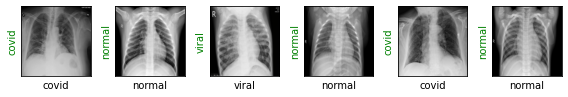

Eğitim Aşaması :  220
Kayıp (Val. Loss): 0.1268, Doğruluk (Accuracy): 0.9778


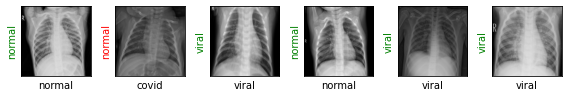

Eğitim Aşaması :  240
Kayıp (Val. Loss): 0.1310, Doğruluk (Accuracy): 0.9778


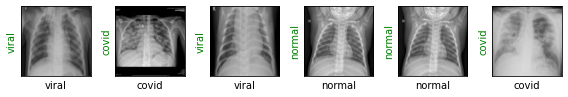

Eğitim Aşaması :  260
Kayıp (Val. Loss): 0.1267, Doğruluk (Accuracy): 0.9778


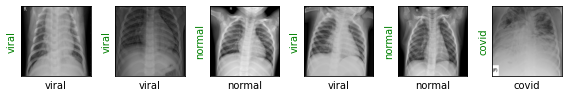

Eğitim Aşaması :  280
Kayıp (Val. Loss): 0.1264, Doğruluk (Accuracy): 0.9667


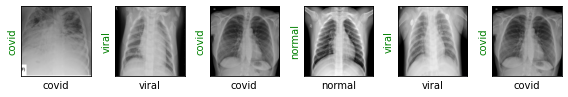

Eğitim Aşaması :  300
Kayıp (Val. Loss): 0.1356, Doğruluk (Accuracy): 0.9667


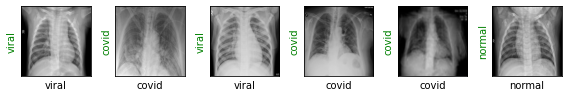

Eğitim Aşaması :  320
Kayıp (Val. Loss): 0.1376, Doğruluk (Accuracy): 0.9667


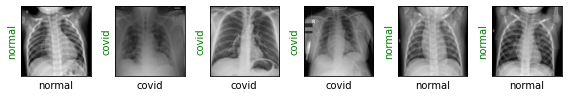

Eğitim Aşaması :  340
Kayıp (Val. Loss): 0.0411, Doğruluk (Accuracy): 0.9889


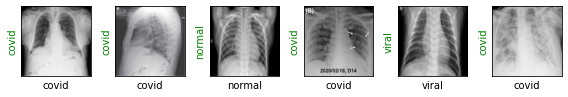

Eğitim Aşaması :  360
Kayıp (Val. Loss): 0.1044, Doğruluk (Accuracy): 0.9778


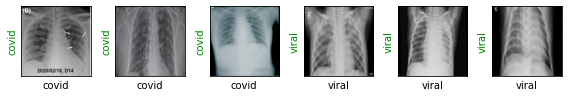

Eğitim Aşaması :  380
Kayıp (Val. Loss): 0.0393, Doğruluk (Accuracy): 0.9889


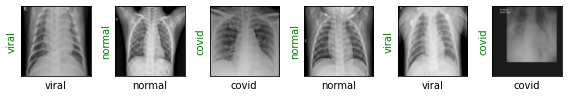

Eğitim Aşaması :  400
Kayıp (Val. Loss): 0.0936, Doğruluk (Accuracy): 0.9667


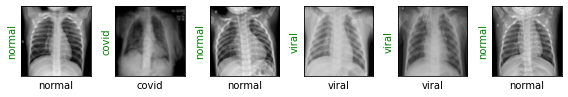

Eğitim Aşaması :  420
Kayıp (Val. Loss): 0.1561, Doğruluk (Accuracy): 0.9556


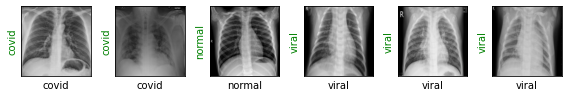

Eğitim Aşaması :  440
Kayıp (Val. Loss): 0.1567, Doğruluk (Accuracy): 0.9444


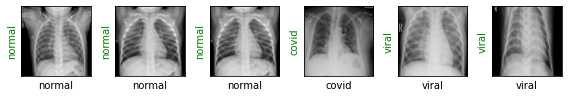

Eğitim Aşaması :  460
Kayıp (Val. Loss): 0.1035, Doğruluk (Accuracy): 0.9778


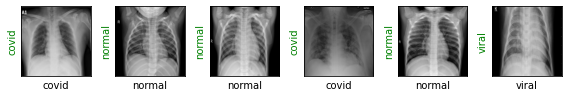

Eğitim Kayıbı (Training Loss) : 0.0268
Eğitim Tamamlanmıştır!


In [24]:
#Modelin Eğitimin başlaması
# 10 epoch sayısı, 

TrainModel(epochs=10)

Modelin eğitimi başladı..
Epoch başlatılıyor :, 1/5
Eğitim Aşaması :  0
Kayıp (Val. Loss): 0.1708, Doğruluk (Accuracy): 0.9556


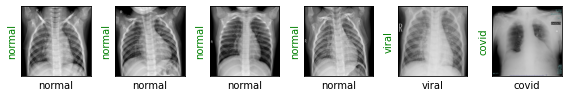

Eğitim Aşaması :  20
Kayıp (Val. Loss): 0.1631, Doğruluk (Accuracy): 0.9778


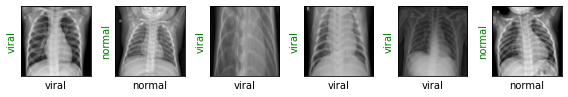

Eğitim Aşaması :  40
Kayıp (Val. Loss): 0.1605, Doğruluk (Accuracy): 0.9556


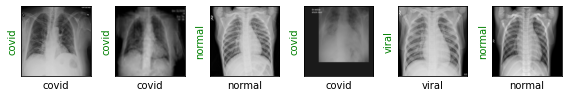

Eğitim Aşaması :  60
Kayıp (Val. Loss): 0.1445, Doğruluk (Accuracy): 0.9556


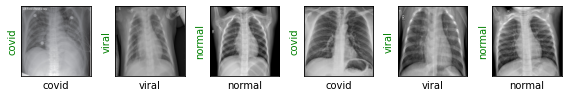

Eğitim Aşaması :  80
Kayıp (Val. Loss): 0.1566, Doğruluk (Accuracy): 0.9444


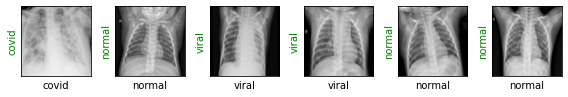

Eğitim Aşaması :  100
Kayıp (Val. Loss): 0.1870, Doğruluk (Accuracy): 0.9667


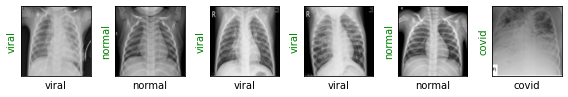

Eğitim Aşaması :  120
Kayıp (Val. Loss): 0.0744, Doğruluk (Accuracy): 0.9889


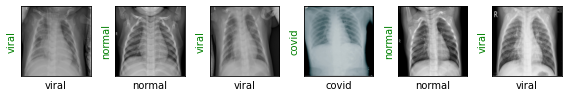

Eğitim Aşaması :  140
Kayıp (Val. Loss): 0.0592, Doğruluk (Accuracy): 0.9778


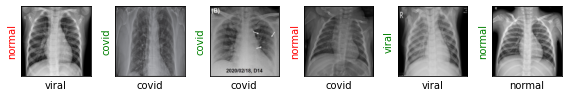

Eğitim Aşaması :  160
Kayıp (Val. Loss): 0.1175, Doğruluk (Accuracy): 0.9667


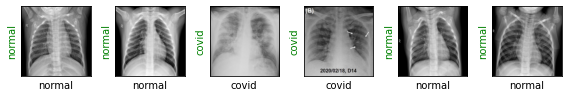

Eğitim Aşaması :  180
Kayıp (Val. Loss): 0.1837, Doğruluk (Accuracy): 0.9556


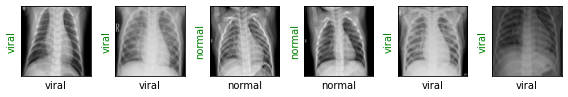

Eğitim Aşaması :  200
Kayıp (Val. Loss): 0.1159, Doğruluk (Accuracy): 0.9556


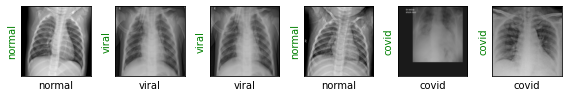

Eğitim Aşaması :  220
Kayıp (Val. Loss): 0.2219, Doğruluk (Accuracy): 0.9556


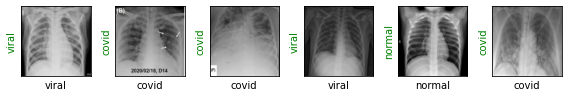

Eğitim Aşaması :  240
Kayıp (Val. Loss): 0.2356, Doğruluk (Accuracy): 0.9444


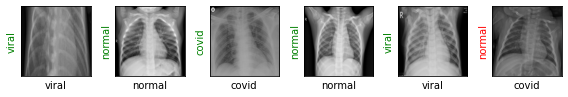

Eğitim Aşaması :  260
Kayıp (Val. Loss): 0.0631, Doğruluk (Accuracy): 0.9778


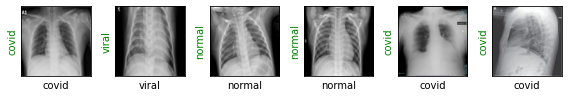

Eğitim Aşaması :  280
Kayıp (Val. Loss): 0.2082, Doğruluk (Accuracy): 0.9556


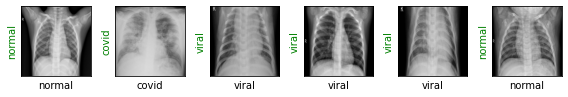

Eğitim Aşaması :  300
Kayıp (Val. Loss): 0.1337, Doğruluk (Accuracy): 0.9444


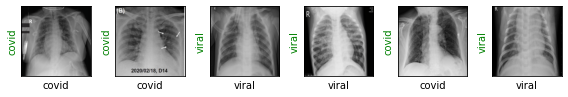

Eğitim Aşaması :  320
Kayıp (Val. Loss): 0.1891, Doğruluk (Accuracy): 0.9444


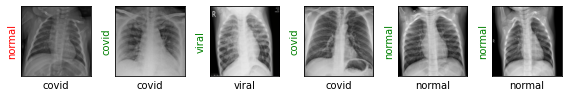

Eğitim Aşaması :  340
Kayıp (Val. Loss): 0.2179, Doğruluk (Accuracy): 0.9444


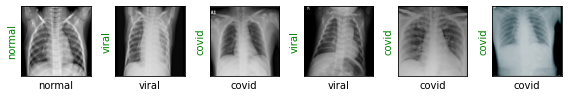

Eğitim Aşaması :  360
Kayıp (Val. Loss): 0.2284, Doğruluk (Accuracy): 0.9444


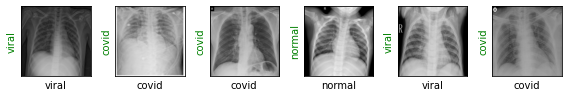

Eğitim Aşaması :  380
Kayıp (Val. Loss): 0.1471, Doğruluk (Accuracy): 0.9667


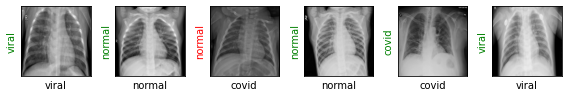

Eğitim Aşaması :  400
Kayıp (Val. Loss): 0.2657, Doğruluk (Accuracy): 0.9333


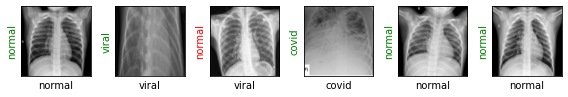

Eğitim Aşaması :  420
Kayıp (Val. Loss): 0.2498, Doğruluk (Accuracy): 0.9556


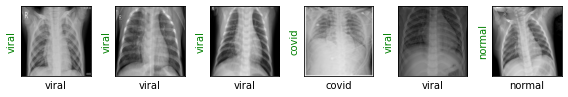

Eğitim Aşaması :  440
Kayıp (Val. Loss): 0.2331, Doğruluk (Accuracy): 0.9667


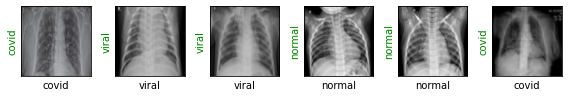

Eğitim Aşaması :  460
Kayıp (Val. Loss): 0.1146, Doğruluk (Accuracy): 0.9667


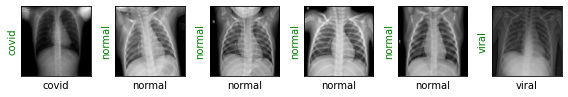

Eğitim Kayıbı (Training Loss) : 0.0321
Epoch başlatılıyor :, 2/5
Eğitim Aşaması :  0
Kayıp (Val. Loss): 0.1866, Doğruluk (Accuracy): 0.9556


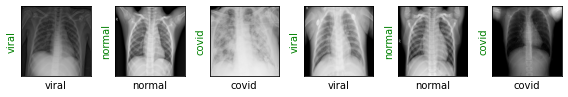

Eğitim Aşaması :  20
Kayıp (Val. Loss): 0.1030, Doğruluk (Accuracy): 0.9889


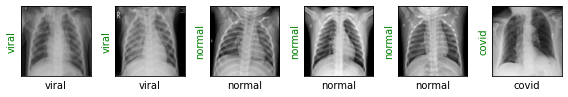

Eğitim Aşaması :  40
Kayıp (Val. Loss): 0.0871, Doğruluk (Accuracy): 0.9778


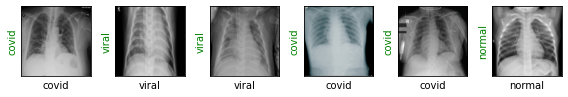

Eğitim Aşaması :  60
Kayıp (Val. Loss): 0.0442, Doğruluk (Accuracy): 0.9889


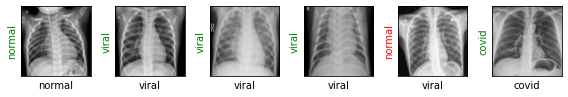

Eğitim Aşaması :  80
Kayıp (Val. Loss): 0.3102, Doğruluk (Accuracy): 0.9444


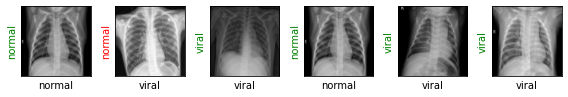

Eğitim Aşaması :  100
Kayıp (Val. Loss): 0.2059, Doğruluk (Accuracy): 0.9667


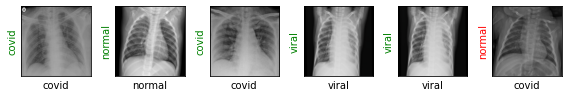

Eğitim Aşaması :  120
Kayıp (Val. Loss): 0.1297, Doğruluk (Accuracy): 0.9444


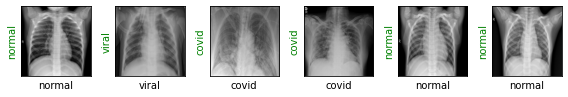

Eğitim Aşaması :  140
Kayıp (Val. Loss): 0.1202, Doğruluk (Accuracy): 0.9778


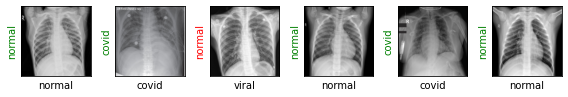

Eğitim Aşaması :  160
Kayıp (Val. Loss): 0.2150, Doğruluk (Accuracy): 0.9667


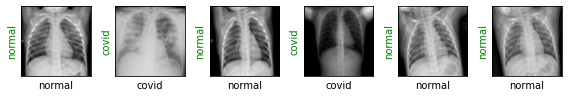

Eğitim Aşaması :  180
Kayıp (Val. Loss): 0.1502, Doğruluk (Accuracy): 0.9778


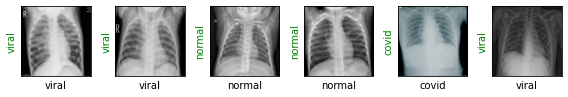

Eğitim Aşaması :  200
Kayıp (Val. Loss): 0.1827, Doğruluk (Accuracy): 0.9556


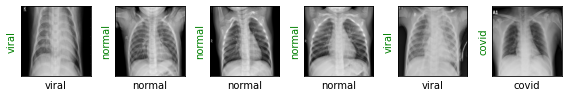

Eğitim Aşaması :  220
Kayıp (Val. Loss): 0.0954, Doğruluk (Accuracy): 0.9667


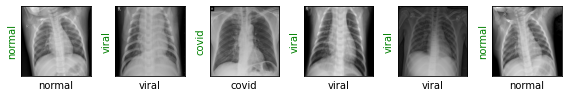

Eğitim Aşaması :  240
Kayıp (Val. Loss): 0.1694, Doğruluk (Accuracy): 0.9667


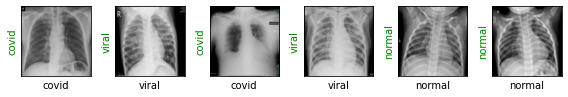

Eğitim Aşaması :  260
Kayıp (Val. Loss): 0.0781, Doğruluk (Accuracy): 0.9889


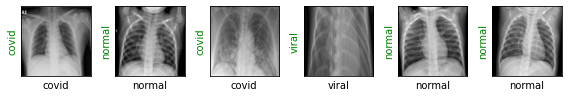

Eğitim Aşaması :  280
Kayıp (Val. Loss): 0.2127, Doğruluk (Accuracy): 0.9556


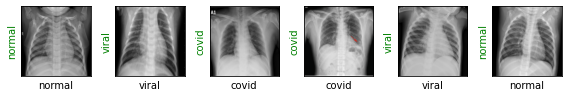

Eğitim Aşaması :  300
Kayıp (Val. Loss): 0.1808, Doğruluk (Accuracy): 0.9778


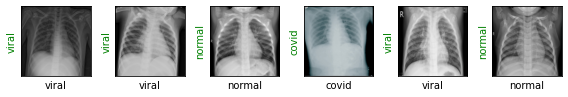

Eğitim Aşaması :  320
Kayıp (Val. Loss): 0.2013, Doğruluk (Accuracy): 0.9778


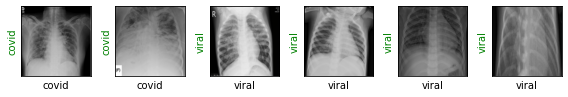

Eğitim Aşaması :  340
Kayıp (Val. Loss): 0.1418, Doğruluk (Accuracy): 0.9778


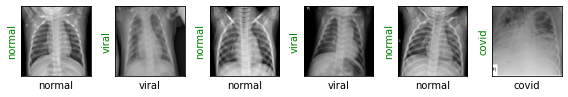

Eğitim Aşaması :  360
Kayıp (Val. Loss): 0.2517, Doğruluk (Accuracy): 0.9333


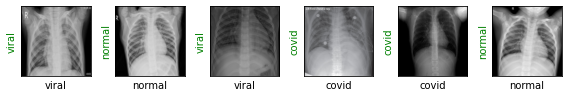

Eğitim Aşaması :  380
Kayıp (Val. Loss): 0.2987, Doğruluk (Accuracy): 0.9556


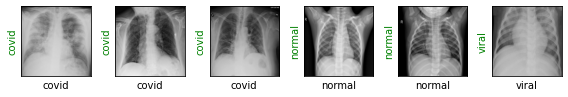

Eğitim Aşaması :  400
Kayıp (Val. Loss): 0.1716, Doğruluk (Accuracy): 0.9778


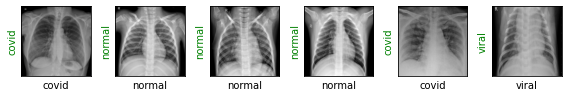

Eğitim Aşaması :  420
Kayıp (Val. Loss): 0.0905, Doğruluk (Accuracy): 0.9889


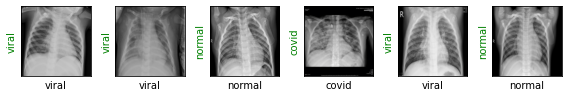

Eğitim Aşaması :  440
Kayıp (Val. Loss): 0.0544, Doğruluk (Accuracy): 0.9889


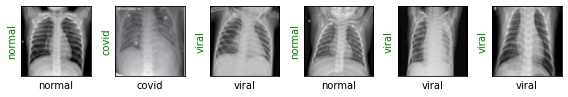

Eğitim Aşaması :  460
Kayıp (Val. Loss): 0.1937, Doğruluk (Accuracy): 0.9667


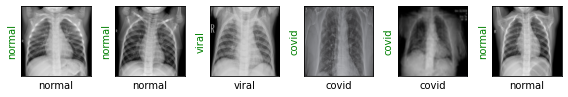

Eğitim Kayıbı (Training Loss) : 0.0361
Epoch başlatılıyor :, 3/5
Eğitim Aşaması :  0
Kayıp (Val. Loss): 0.0079, Doğruluk (Accuracy): 1.0000


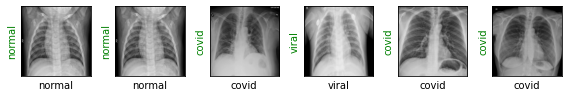

Eğitim Aşaması :  20
Kayıp (Val. Loss): 0.2306, Doğruluk (Accuracy): 0.9667


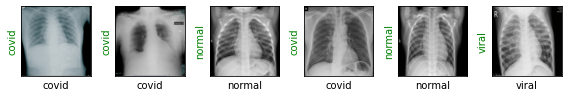

Eğitim Aşaması :  40
Kayıp (Val. Loss): 0.1908, Doğruluk (Accuracy): 0.9778


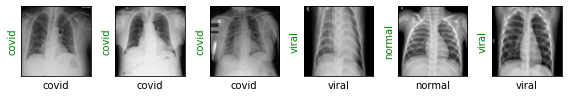

Eğitim Aşaması :  60
Kayıp (Val. Loss): 0.3357, Doğruluk (Accuracy): 0.9444


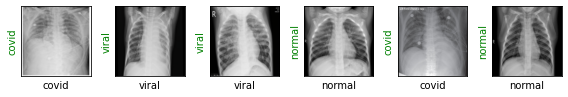

Eğitim Aşaması :  80
Kayıp (Val. Loss): 0.1346, Doğruluk (Accuracy): 0.9778


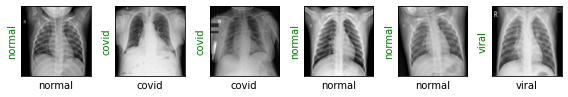

Eğitim Aşaması :  100
Kayıp (Val. Loss): 0.1808, Doğruluk (Accuracy): 0.9556


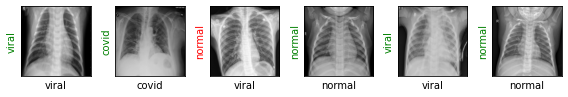

Eğitim Aşaması :  120
Kayıp (Val. Loss): 0.3033, Doğruluk (Accuracy): 0.9333


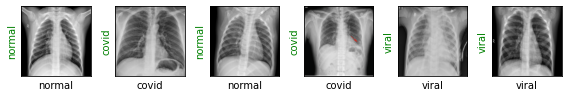

Eğitim Aşaması :  140
Kayıp (Val. Loss): 0.1068, Doğruluk (Accuracy): 0.9778


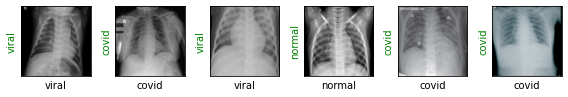

Eğitim Aşaması :  160
Kayıp (Val. Loss): 0.1010, Doğruluk (Accuracy): 0.9667


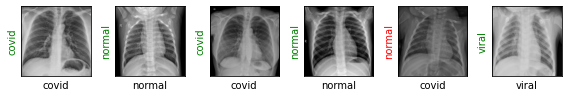

Eğitim Aşaması :  180
Kayıp (Val. Loss): 0.1214, Doğruluk (Accuracy): 0.9778


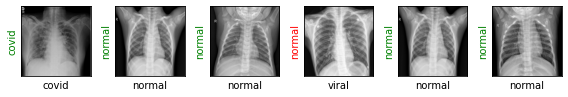

Eğitim Aşaması :  200
Kayıp (Val. Loss): 0.2117, Doğruluk (Accuracy): 0.9556


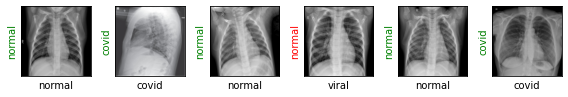

Eğitim Aşaması :  220
Kayıp (Val. Loss): 0.1353, Doğruluk (Accuracy): 0.9556


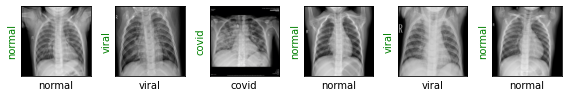

Eğitim Aşaması :  240
Kayıp (Val. Loss): 0.1377, Doğruluk (Accuracy): 0.9778


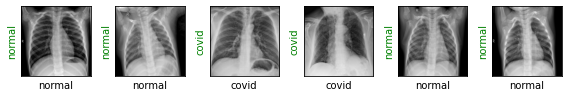

Eğitim Aşaması :  260
Kayıp (Val. Loss): 0.1468, Doğruluk (Accuracy): 0.9778


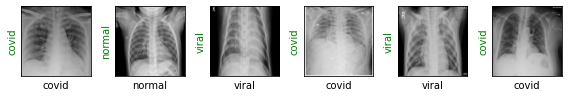

Eğitim Aşaması :  280
Kayıp (Val. Loss): 0.1827, Doğruluk (Accuracy): 0.9667


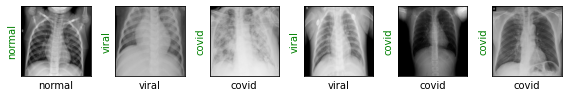

Eğitim Aşaması :  300
Kayıp (Val. Loss): 0.2077, Doğruluk (Accuracy): 0.9333


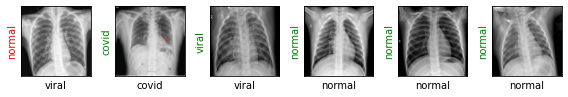

Eğitim Aşaması :  320
Kayıp (Val. Loss): 0.1586, Doğruluk (Accuracy): 0.9556


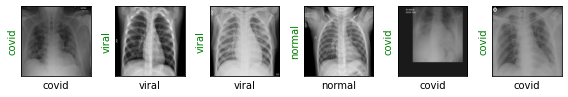

Eğitim Aşaması :  340
Kayıp (Val. Loss): 0.1383, Doğruluk (Accuracy): 0.9778


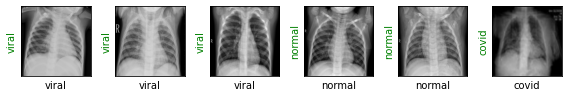

Eğitim Aşaması :  360
Kayıp (Val. Loss): 0.0980, Doğruluk (Accuracy): 0.9889


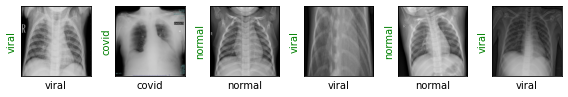

Eğitim Aşaması :  380
Kayıp (Val. Loss): 0.1388, Doğruluk (Accuracy): 0.9778


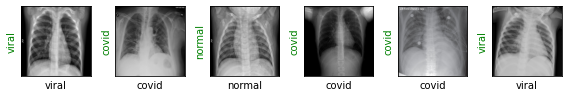

Eğitim Aşaması :  400
Kayıp (Val. Loss): 0.0245, Doğruluk (Accuracy): 0.9889


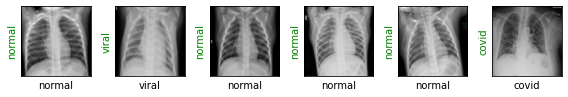

Eğitim Aşaması :  420
Kayıp (Val. Loss): 0.1018, Doğruluk (Accuracy): 0.9556


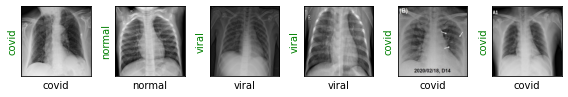

Eğitim Aşaması :  440
Kayıp (Val. Loss): 0.1767, Doğruluk (Accuracy): 0.9667


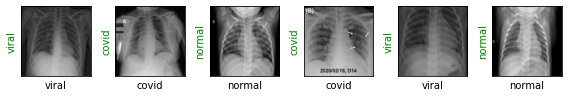

Eğitim Aşaması :  460
Kayıp (Val. Loss): 0.0405, Doğruluk (Accuracy): 0.9889


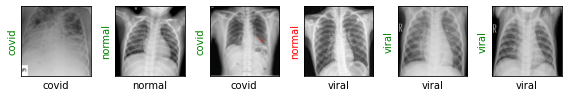

Eğitim Kayıbı (Training Loss) : 0.0297
Epoch başlatılıyor :, 4/5
Eğitim Aşaması :  0
Kayıp (Val. Loss): 0.1738, Doğruluk (Accuracy): 0.9556


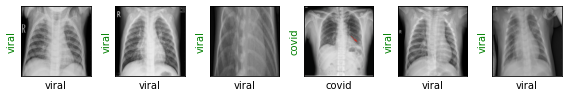

Eğitim Aşaması :  20
Kayıp (Val. Loss): 0.1252, Doğruluk (Accuracy): 0.9889


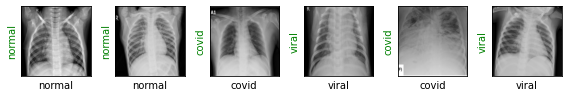

Eğitim Aşaması :  40
Kayıp (Val. Loss): 0.3047, Doğruluk (Accuracy): 0.9556


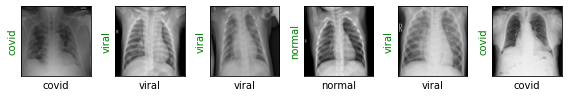

Eğitim Aşaması :  60
Kayıp (Val. Loss): 0.1228, Doğruluk (Accuracy): 0.9556


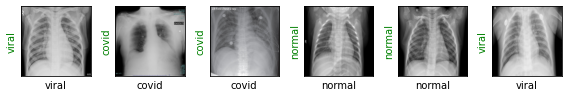

Eğitim Aşaması :  80
Kayıp (Val. Loss): 0.1454, Doğruluk (Accuracy): 0.9778


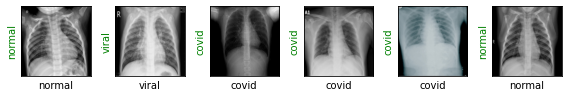

Eğitim Aşaması :  100
Kayıp (Val. Loss): 0.4069, Doğruluk (Accuracy): 0.9444


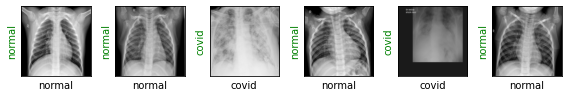

Eğitim Aşaması :  120
Kayıp (Val. Loss): 0.2480, Doğruluk (Accuracy): 0.9667


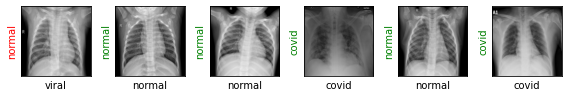

Eğitim Aşaması :  140
Kayıp (Val. Loss): 0.1033, Doğruluk (Accuracy): 0.9778


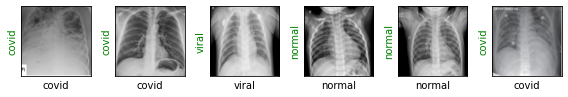

Eğitim Aşaması :  160
Kayıp (Val. Loss): 0.2279, Doğruluk (Accuracy): 0.9556


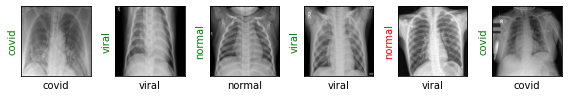

Eğitim Aşaması :  180
Kayıp (Val. Loss): 0.1564, Doğruluk (Accuracy): 0.9556


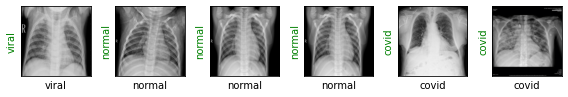

Eğitim Aşaması :  200
Kayıp (Val. Loss): 0.1068, Doğruluk (Accuracy): 0.9778


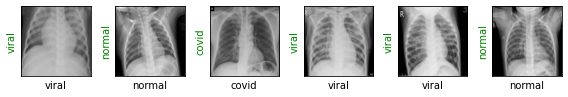

Eğitim Aşaması :  220
Kayıp (Val. Loss): 0.2546, Doğruluk (Accuracy): 0.9556


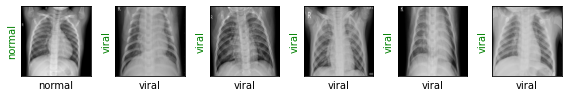

Eğitim Aşaması :  240
Kayıp (Val. Loss): 0.3618, Doğruluk (Accuracy): 0.9556


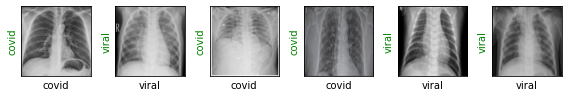

Eğitim Aşaması :  260
Kayıp (Val. Loss): 0.1500, Doğruluk (Accuracy): 0.9778


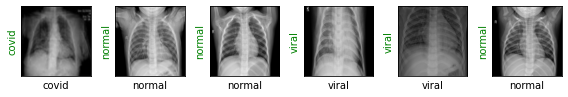

Eğitim Aşaması :  280
Kayıp (Val. Loss): 0.0895, Doğruluk (Accuracy): 0.9778


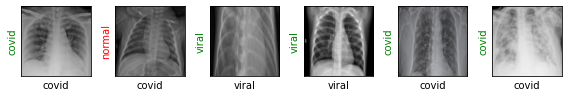

Eğitim Aşaması :  300
Kayıp (Val. Loss): 0.0556, Doğruluk (Accuracy): 0.9889


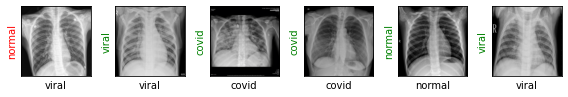

Eğitim Aşaması :  320
Kayıp (Val. Loss): 0.2968, Doğruluk (Accuracy): 0.9556


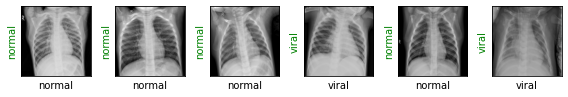

Eğitim Aşaması :  340
Kayıp (Val. Loss): 0.1025, Doğruluk (Accuracy): 0.9778


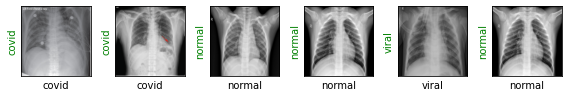

Eğitim Aşaması :  360
Kayıp (Val. Loss): 0.1055, Doğruluk (Accuracy): 0.9667


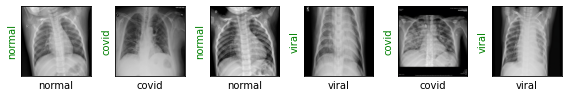

Eğitim Aşaması :  380
Kayıp (Val. Loss): 0.1125, Doğruluk (Accuracy): 0.9889


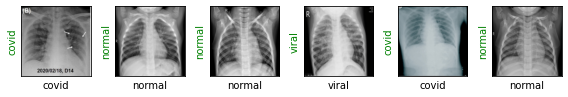

Eğitim Aşaması :  400
Kayıp (Val. Loss): 0.1943, Doğruluk (Accuracy): 0.9667


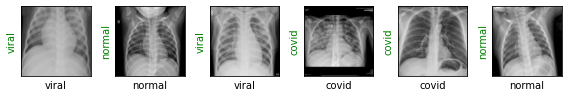

Eğitim Aşaması :  420
Kayıp (Val. Loss): 0.1305, Doğruluk (Accuracy): 0.9778


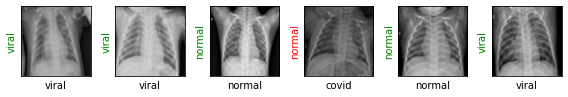

Eğitim Aşaması :  440
Kayıp (Val. Loss): 0.0497, Doğruluk (Accuracy): 0.9889


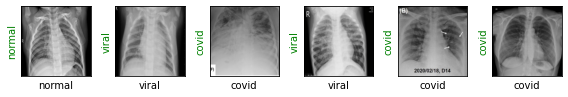

Eğitim Aşaması :  460
Kayıp (Val. Loss): 0.0979, Doğruluk (Accuracy): 0.9889


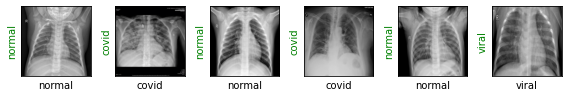

Eğitim Kayıbı (Training Loss) : 0.0085
Epoch başlatılıyor :, 5/5
Eğitim Aşaması :  0
Kayıp (Val. Loss): 0.1892, Doğruluk (Accuracy): 0.9444


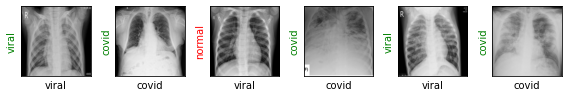

Eğitim Aşaması :  20
Kayıp (Val. Loss): 0.1507, Doğruluk (Accuracy): 0.9778


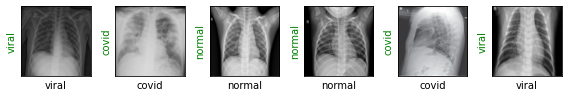

Eğitim Aşaması :  40
Kayıp (Val. Loss): 0.1068, Doğruluk (Accuracy): 0.9778


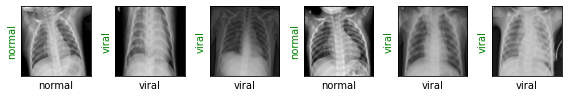

Eğitim Aşaması :  60
Kayıp (Val. Loss): 0.1039, Doğruluk (Accuracy): 0.9889


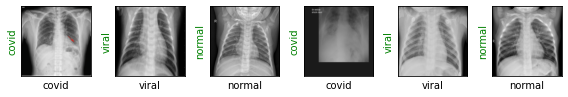

Eğitim Aşaması :  80
Kayıp (Val. Loss): 0.0958, Doğruluk (Accuracy): 0.9667


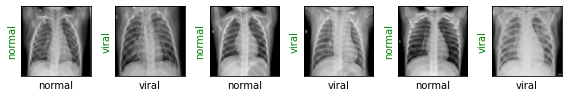

Eğitim Aşaması :  100
Kayıp (Val. Loss): 0.1464, Doğruluk (Accuracy): 0.9778


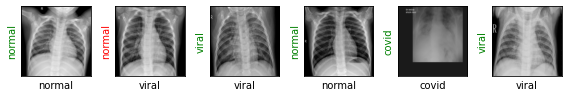

Eğitim Aşaması :  120
Kayıp (Val. Loss): 0.3446, Doğruluk (Accuracy): 0.9222


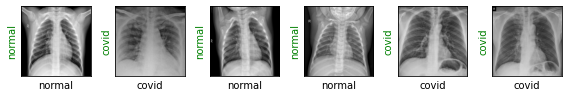

Eğitim Aşaması :  140
Kayıp (Val. Loss): 0.3529, Doğruluk (Accuracy): 0.9333


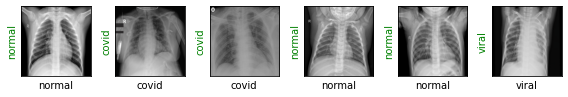

Eğitim Aşaması :  160
Kayıp (Val. Loss): 0.2580, Doğruluk (Accuracy): 0.9556


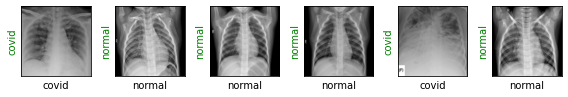

Eğitim Aşaması :  180
Kayıp (Val. Loss): 0.1962, Doğruluk (Accuracy): 0.9667


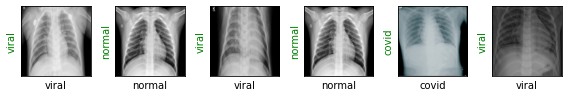

Eğitim Aşaması :  200
Kayıp (Val. Loss): 0.1101, Doğruluk (Accuracy): 0.9778


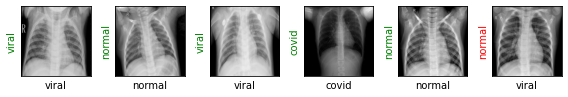

Eğitim Aşaması :  220
Kayıp (Val. Loss): 0.2285, Doğruluk (Accuracy): 0.9556


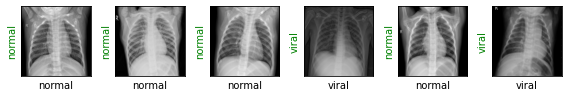

Eğitim Aşaması :  240
Kayıp (Val. Loss): 0.1952, Doğruluk (Accuracy): 0.9556


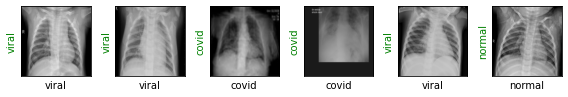

Eğitim Aşaması :  260
Kayıp (Val. Loss): 0.1370, Doğruluk (Accuracy): 0.9667


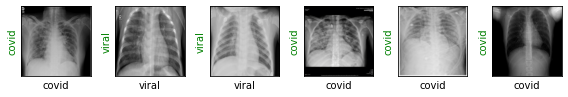

Eğitim Aşaması :  280
Kayıp (Val. Loss): 0.1977, Doğruluk (Accuracy): 0.9556


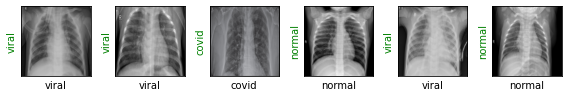

Eğitim Aşaması :  300
Kayıp (Val. Loss): 0.2126, Doğruluk (Accuracy): 0.9556


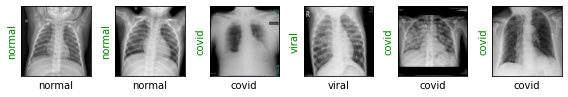

Eğitim Aşaması :  320
Kayıp (Val. Loss): 0.1545, Doğruluk (Accuracy): 0.9778


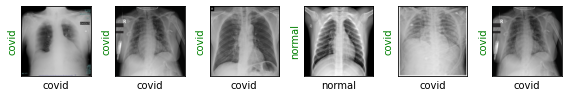

Eğitim Aşaması :  340
Kayıp (Val. Loss): 0.2746, Doğruluk (Accuracy): 0.9556


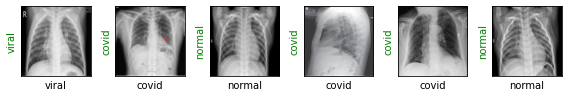

Eğitim Aşaması :  360
Kayıp (Val. Loss): 0.1510, Doğruluk (Accuracy): 0.9667


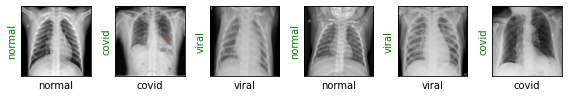

Eğitim Aşaması :  380
Kayıp (Val. Loss): 0.2758, Doğruluk (Accuracy): 0.9556


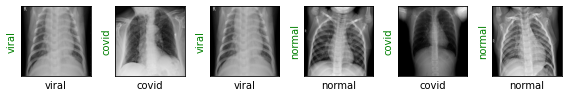

Eğitim Aşaması :  400
Kayıp (Val. Loss): 0.0757, Doğruluk (Accuracy): 0.9889


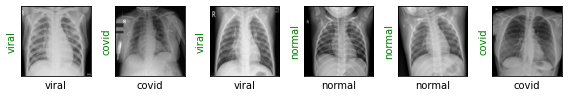

Eğitim Aşaması :  420
Kayıp (Val. Loss): 0.2593, Doğruluk (Accuracy): 0.9556


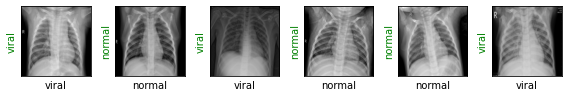

Eğitim Aşaması :  440
Kayıp (Val. Loss): 0.2641, Doğruluk (Accuracy): 0.9556


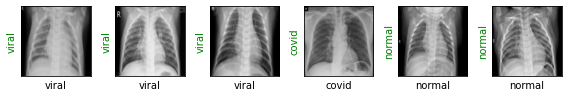

Eğitim Aşaması :  460
Kayıp (Val. Loss): 0.2275, Doğruluk (Accuracy): 0.9556


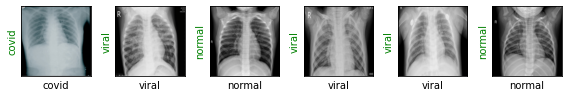

Eğitim Kayıbı (Training Loss) : 0.0307
Eğitim Tamamlanmıştır!


In [25]:
#Modelin Eğitimin başlaması
# 5 epoch sayısı, 

TrainModel(epochs=5)

# Model Tahminlemesi

tensor([ 1.8208, 10.9568,  9.7488, 11.9572,  2.9007,  8.7193],
       grad_fn=<MaxBackward0>)
tensor([0, 1, 2, 1, 1, 1])
tensor([0, 1, 2, 1, 0, 1])


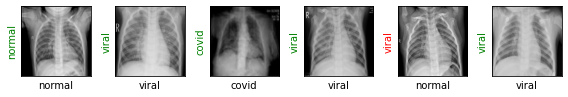

In [30]:
ResultPrediction()